#**BLUF**

|**Regressor** |    MSE    |       MAE      |    $R^2$    |  Worst Prediction Error % |
|:----------------------|:------------:|:--------------:|:-------------:|:-------------:|
|XGBoost | 0.03 | 0.14 | 0.89 | 3.44 |
|AdaBoost | 0.03 | 0.15 | 0.88 | 4.11 |

XGBoost is the final model we choose for the regression model of this regression task. We transformed the data and did base model comparison, followed by grid search approach. We then evaluated over prediction percenage as it is important for pricing problems. Finally, we compared our model to pycaret and determined that pycaret has its overfitting issues. Our XGBoost model beats Pycaret in the sense of $R^2$ score.

We believe that three features, 'highwaympg','enginesize', 'curbweight', are the most important features for this business problem.

###Brief explanation
After bringing features onto the same scale with normalization and standardization, we consider XGBoost and AdaBoost are the top-performing base regressors for the given dataset, based on the given performance results on the holdout sample.

|**Regressor** |    MSE    |       MAE      |    $R^2$    |Worst Prediction Error % |
|:----------------------|:------------:|:--------------:|:-------------:|:-------------:|
|Multiple Linear Regression | 0.04 | 0.15 | 0.87 | 2.76 |
|Lasso Regression | 0.13 | 0.29 | 0.54 | 7.11 |
|Ridge Regression | 0.04 | 0.15 | 0.87 | 2.78 |
|ElasticNet Regression | 0.05 | 0.19 | 0.81 | 4.37 |
|KNN | 0.06 | 0.17 | 0.80 | 3.41 |
|SVR | 0.05 | 0.16 | 0.83 | 3.28 |
|Decision Tree | 0.05 | 0.16 | 0.84 | 6.19 |
|Multilayer Perceptron | 0.48 | 0.52 | -0.67 | 4.07 |


Both models have low mean squared error (MSE) and mean absolute error (MAE) values, high R-squared values, and consistent performance across all prediction folds.

Overall, the XGboost outperforms AdaBoost as it has the best metrics in every sense. Therefore, we consider XGBoost as the best model for the given dataset among all the listed models.

From the learning curve, the gap for the XGBoost is a little bit larger. From the Prediction & Actuals graph, the XGBoost performs well, since the data is visually close to the diagonal. Percentage of instance overpredicted is 58.54%. 




#**Business Problem**
 
![car](https://img.philkotse.com/2022/02/24/O3IWXvly/img-7320-a0a5_wm.jpg)


A Chinese automobile company Geely Auto aspires to enter the US market by setting up their manufacturing unit there and producing cars locally to give competition to their US and European counterparts.

They have contracted an automobile consulting company to understand the factors on which the pricing of cars depends. Specifically, they want to understand the factors affecting the pricing of cars in the American market, since those may be very different from the Chinese market. The company wants to know:

Which variables are significant in predicting the price of a car?

How well those variables describe the price of a car?

Based on various market surveys, the consulting firm has gathered a large data set of different types of cars across the America market.

**Business Goal**

We are required to model the price of cars with the available independent variables. It will be used by the management to understand how exactly the prices vary with the independent variables. They can accordingly manipulate the design of the cars, the business strategy etc. to meet certain price levels. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

#**Hackathon Checklist**
Develop at least three "code"  regerssors (i.e., using scikit-learn or similar libraries) and gridsearch the best one. You can use either original or Compare it to the best "low-code" (i.e., PyCaret), using/adapting the code provided.

Decide and implement a validation strategy, and decide whether scaling is needed.  Use learning curves to determine if your regressors are overfitted.

#**Libraries**

In [1]:
# import libraries
#!pip install -q pycaret autoviz psynlig
from pycaret.regression import *
from autoviz.AutoViz_Class import AutoViz_Class

Imported v0.1.601. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [2]:
# PCA
from sklearn.decomposition import PCA
from psynlig import pca_explained_variance_bar

In [3]:
# Basic libraries
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import unique
from numpy import where
from numpy import mean
from numpy import std
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import pyplot
import scipy.stats as ss
import math

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from numpy import mean
from numpy import absolute
from numpy import loadtxt
from datetime import datetime
import scipy.stats as ss
from scipy.stats.mstats import winsorize

In [5]:
!pip install --quiet sweetviz     # You may need to pip install sweetviz
import sweetviz as sv

# Plotly & Jupyter-Dash
!pip install --quiet --upgrade plotly
!pip install --quiet jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
import dash
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

In [6]:
# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn import metrics
from sklearn import linear_model
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, StackingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV

In [7]:
# Libraries
from sklearn.svm import SVR
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from sklearn.model_selection import ShuffleSplit
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline

from sklearn.utils._testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning

In [8]:
# XGBoost & LightGBM
from xgboost import XGBRegressor
import lightgbm as lgb

In [11]:
#Keras
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.metrics import mean_squared_error

In [12]:
from datetime import datetime

#**Data Dictionary**

Attribute Information:
1. **symboling**: -3, -2, -1, 0, 1, 2, 3.
2. **normalized-losses**: continuous from 65 to 256.
3. **make**:
alfa-romero, audi, bmw, chevrolet, dodge, honda,
isuzu, jaguar, mazda, mercedes-benz, mercury,
mitsubishi, nissan, peugot, plymouth, porsche,
renault, saab, subaru, toyota, volkswagen, volvo
4. **fuel-type**: diesel, gas.
5. **aspiration**: std, turbo.
6. **num-of-doors**: four, two.
7. **body-style**: hardtop, wagon, sedan, hatchback, convertible.
8. **drive-wheels**: 4wd, fwd, rwd.
9. **engine-location**: front, rear.
10. **wheel-base**: continuous from 86.6 120.9.
11. **length**: continuous from 141.1 to 208.1.
12. **width**: continuous from 60.3 to 72.3.
13. **height**: continuous from 47.8 to 59.8.
14. **curb-weight**: continuous from 1488 to 4066.
15. **engine-type**: dohc, dohcv, l, ohc, ohcf, ohcv, rotor.
16. **num-of-cylinders**: eight, five, four, six, three, twelve, two.
17. **engine-size**: continuous from 61 to 326.
18. **fuel-system**: 1bbl, 2bbl, 4bbl, idi, mfi, mpfi, spdi, spfi.
19. **bore**: continuous from 2.54 to 3.94.
20. **stroke**: continuous from 2.07 to 4.17.
21. **compression-ratio**: continuous from 7 to 23.
22. **horsepower**: continuous from 48 to 288.
23. **peak-rpm**: continuous from 4150 to 6600.
24. **city-mpg**: continuous from 13 to 49.
25. **highway-mpg**: continuous from 16 to 54.
26. **price**: continuous from 5118 to 45400. **TARGET VARIABLE**

![car](https://static.javatpoint.com/best/images/best-cars-in-the-world6.png)

In [13]:
# Read
# File: https://drive.google.com/file/d/1_IXAnBBooHBdh8YbszsIQAi47aknej2K/view?usp=share_link
url = 'https://drive.google.com/uc?id=1_IXAnBBooHBdh8YbszsIQAi47aknej2K'

# Read in the dataset
df = pd.read_csv(url)

In [14]:
# Head of df
df.head(5)

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


#**M2 & M3: EDA & & Data Preprocessing**

In [15]:
df.columns

Index(['car_ID', 'symboling', 'CarName', 'fueltype', 'aspiration',
       'doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase',
       'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype',
       'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price'],
      dtype='object')

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

##*NaNs, Dups, etc*

In [17]:
# Shape
print(df.shape)
# Head
print(df.head())
# Info
print(df.info())
# Check for missing values
print('\n\nMissing Values\n',df.isnull().sum(axis=0))
# Check for duplicates
print('\n Duplicates\n',df.duplicated().sum())

(205, 26)
   car_ID  symboling                   CarName fueltype aspiration doornumber  \
0       1          3        alfa-romero giulia      gas        std        two   
1       2          3       alfa-romero stelvio      gas        std        two   
2       3          1  alfa-romero Quadrifoglio      gas        std        two   
3       4          2               audi 100 ls      gas        std       four   
4       5          2                audi 100ls      gas        std       four   

       carbody drivewheel enginelocation  wheelbase  ...  enginesize  \
0  convertible        rwd          front       88.6  ...         130   
1  convertible        rwd          front       88.6  ...         130   
2    hatchback        rwd          front       94.5  ...         152   
3        sedan        fwd          front       99.8  ...         109   
4        sedan        4wd          front       99.4  ...         136   

   fuelsystem  boreratio  stroke compressionratio horsepower  peakrpm 

In [18]:
# Drop car_ID and symboling
df.drop(['car_ID',	'symboling'], axis=1, inplace=True)
df.head()

,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


##*Quants & Categoricals*

In [19]:
categorical_features = ['CarName', 'fueltype', 'aspiration',
       'doornumber', 'carbody', 'drivewheel', 'enginelocation','enginetype',
       'cylindernumber','fuelsystem']
quant_features = list(set(df.columns) - set(categorical_features)-set(['price']))
target = ['price']

##*Descriptive Statistics*

In [20]:
df.describe()

,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


##*Encodings*

In [21]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

# apply label encoding to each column
for col in categorical_features:
    if df[col].dtype == 'object':
        df[col] = le.fit_transform(df[col])


In [22]:
df

,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,2,1,0,1,0,2,0,88.6,168.8,64.1,...,130,5,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,1,0,1,0,2,0,88.6,168.8,64.1,...,130,5,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,1,0,1,2,2,0,94.5,171.2,65.5,...,152,5,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,1,0,0,3,1,0,99.8,176.6,66.2,...,109,5,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,1,0,0,3,0,0,99.4,176.6,66.4,...,136,5,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,139,1,0,0,3,2,0,109.1,188.8,68.9,...,141,5,3.78,3.15,9.5,114,5400,23,28,16845.0
201,138,1,1,0,3,2,0,109.1,188.8,68.8,...,141,5,3.78,3.15,8.7,160,5300,19,25,19045.0
202,140,1,0,0,3,2,0,109.1,188.8,68.9,...,173,5,3.58,2.87,8.8,134,5500,18,23,21485.0
203,142,0,1,0,3,2,0,109.1,188.8,68.9,...,145,3,3.01,3.40,23.0,106,4800,26,27,22470.0


##*Correlation Heatmap*

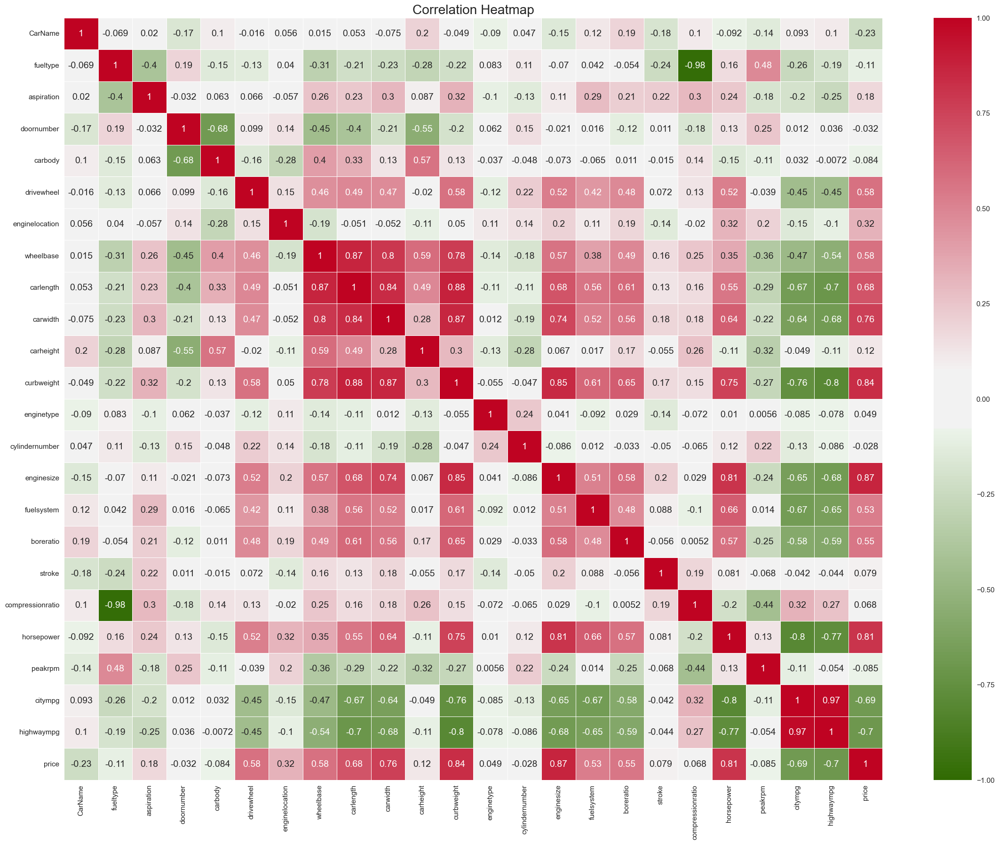

In [23]:
# Correlation matrix to get a sense of predictor quality
%matplotlib inline
sns.set_style('darkgrid')
plt.figure(figsize = (25,20))
cmap = sns.diverging_palette(120, 10, l = 40, s = 99, sep = 20, center = 'light', as_cmap = True) 
sns.heatmap((df).corr(), vmin = -1, vmax = 1, annot = True, cmap = cmap, lw = .5, linecolor = 'white')
plt.title("Correlation Heatmap")
plt.show()

##*Skewness*

In [24]:
#Skewness of target
from scipy.stats import skew

# Log-transform columns with skewness > 1
if skew(df[target]) > 1:
    df[target] = np.log1p(df[target])
    print("Took the log of the target + 1 (i.e., log1p(df[target])")


Took the log of the target + 1 (i.e., log1p(df[target])


In [25]:
#Check skewness of each feature
print('Skewness\n', df[quant_features].skew().sort_values(ascending=False))

Skewness
 compressionratio    2.610862
enginesize          1.947655
horsepower          1.405310
wheelbase           1.050214
carwidth            0.904003
curbweight          0.681398
citympg             0.663704
highwaympg          0.539997
carlength           0.155954
peakrpm             0.075159
carheight           0.063123
boreratio           0.020156
stroke             -0.689705
dtype: float64


In [26]:
# -*- coding: utf-8 -*-
"""
Created on Sat Feb 23 14:42:46 2019
@author: DATAmadness
"""

##################################################
# A function that will accept a pandas dataframe
# and auto-transforms columns that exceeds threshold value
#  -  Offers choice between boxcox or log / exponential transformation
#  -  Automatically handles negative values
#  -  Auto recognizes positive /negative skewness

# Further documentation available here:
# https://datamadness.github.io/Skewness_Auto_Transform




import seaborn as sns
import numpy as np
import math
import scipy.stats as ss
import matplotlib.pyplot as plt

def skew_autotransform(DF, include = None, exclude = None, plot = False, threshold = 1, exp = False):
    
    #Get list of column names that should be processed based on input parameters
    if include is None and exclude is None:
        colnames = DF.columns.values
    elif include is not None:
        colnames = include
    elif exclude is not None:
        colnames = [item for item in list(DF.columns.values) if item not in exclude]
    else:
        print('No columns to process!')
    
    #Helper function that checks if all values are positive
    def make_positive(series):
        minimum = np.amin(series)
        #If minimum is negative, offset all values by a constant to move all values to positive teritory
        if minimum <= 0:
            series = series + abs(minimum) + 0.01
        return series
    
    
    #Go throug desired columns in DataFrame
    for col in colnames:
        #Get column skewness
        skew = DF[col].skew()
        transformed = True
        
        if plot:
            #Prep the plot of original data
            sns.set_style("darkgrid")
            sns.set_palette("Blues_r")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            ax1 = sns.distplot(DF[col], ax=axes[0])
            ax1.set(xlabel='Original ' + col)
        
        #If skewness is larger than threshold and positively skewed; If yes, apply appropriate transformation
        if abs(skew) > threshold and skew > 0:
            skewType = 'positive'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply log transformation 
               DF[col] = DF[col].apply(math.log)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
         
        elif abs(skew) > threshold and skew < 0:
            skewType = 'negative'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply exp transformation 
               DF[col] = DF[col].pow(10)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
        
        else:
            #Flag if no transformation was performed
            transformed = False
            skew_new = skew
        
        #Compare before and after if plot is True
        if plot:
            print('\n ------------------------------------------------------')     
            if transformed:
                print('\n %r had %r skewness of %2.2f' %(col, skewType, skew))
                print('\n Transformation yielded skewness of %2.2f' %(skew_new))
                sns.set_palette("Paired")
                ax2 = sns.distplot(DF[col], ax=axes[1], color = 'r')
                ax2.set(xlabel='Transformed ' + col)
                plt.show()
            else:
                print('\n NO TRANSFORMATION APPLIED FOR %r . Skewness = %2.2f' %(col, skew))
                ax2 = sns.distplot(DF[col], ax=axes[1])
                ax2.set(xlabel='NO TRANSFORM ' + col)
                plt.show()
                

    return DF



 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'carheight' . Skewness = 0.06


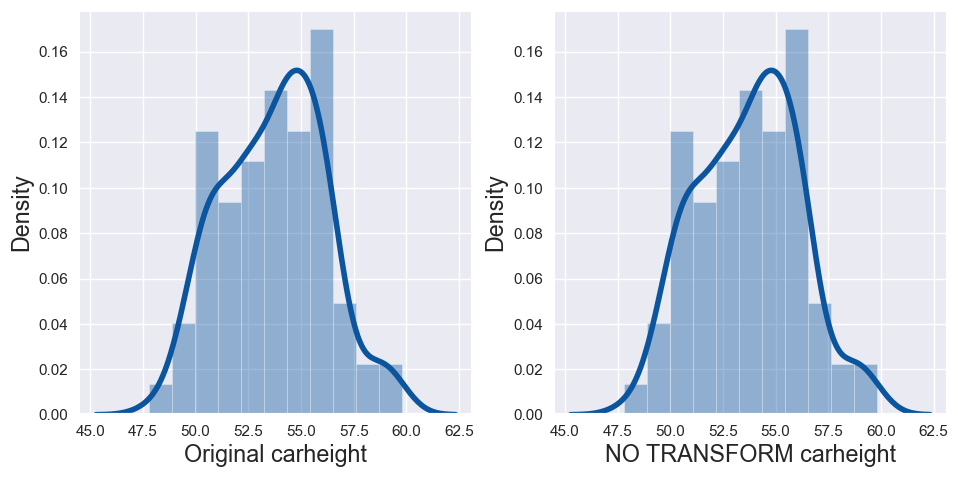


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'peakrpm' . Skewness = 0.08


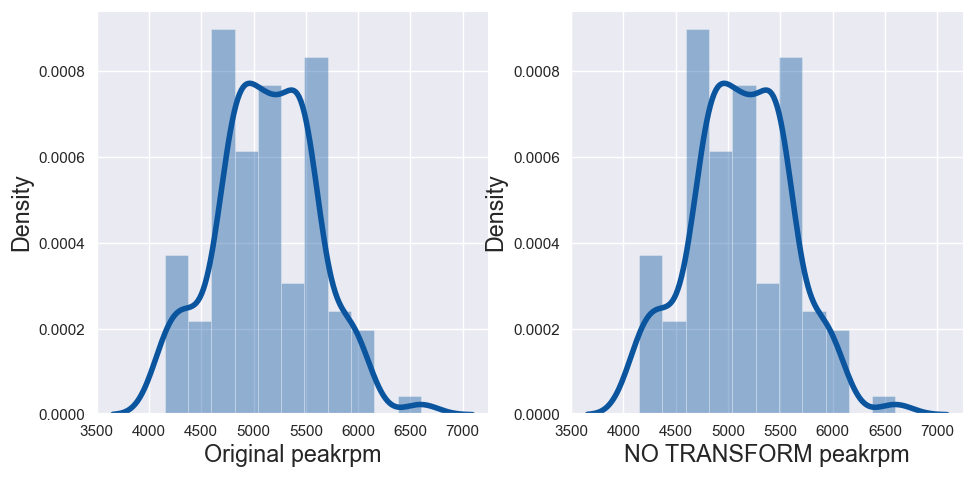


 ------------------------------------------------------

 'enginesize' had 'positive' skewness of 1.95

 Transformation yielded skewness of 0.86


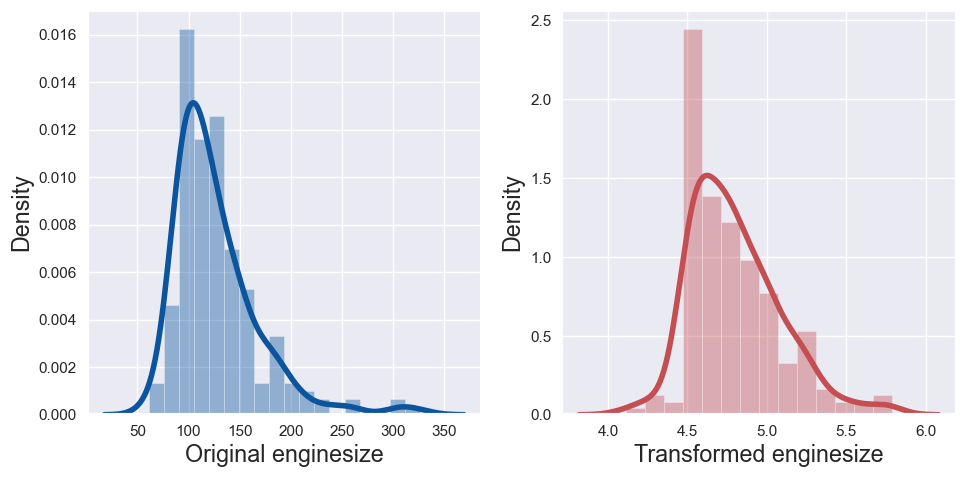


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'citympg' . Skewness = 0.66


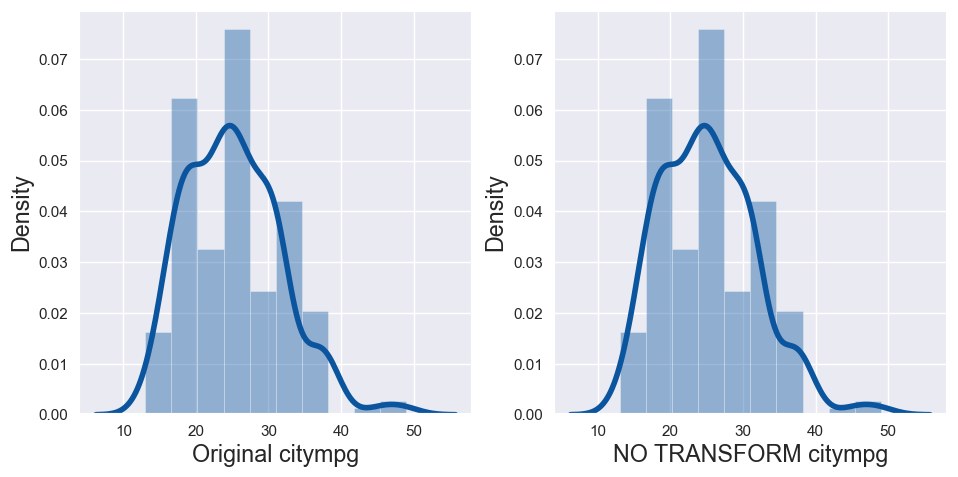


 ------------------------------------------------------

 'compressionratio' had 'positive' skewness of 2.61

 Transformation yielded skewness of 2.35


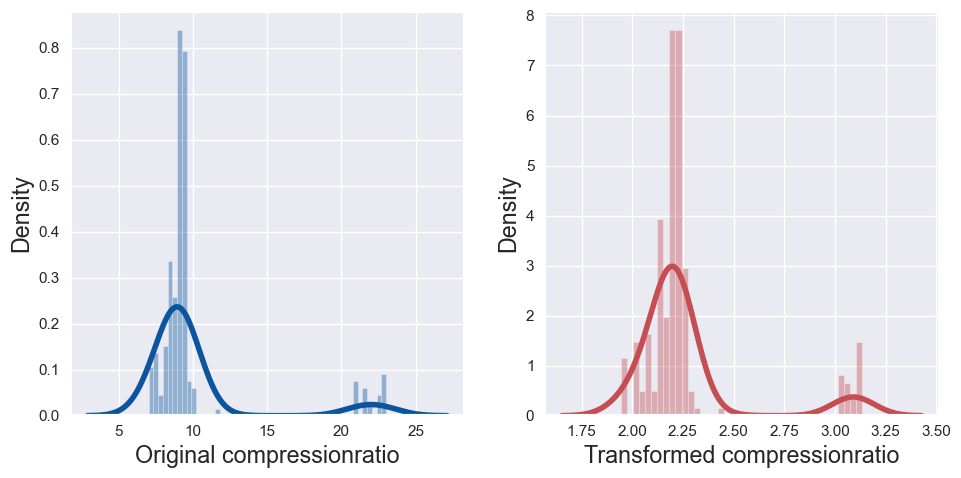


 ------------------------------------------------------

 'horsepower' had 'positive' skewness of 1.41

 Transformation yielded skewness of 0.48


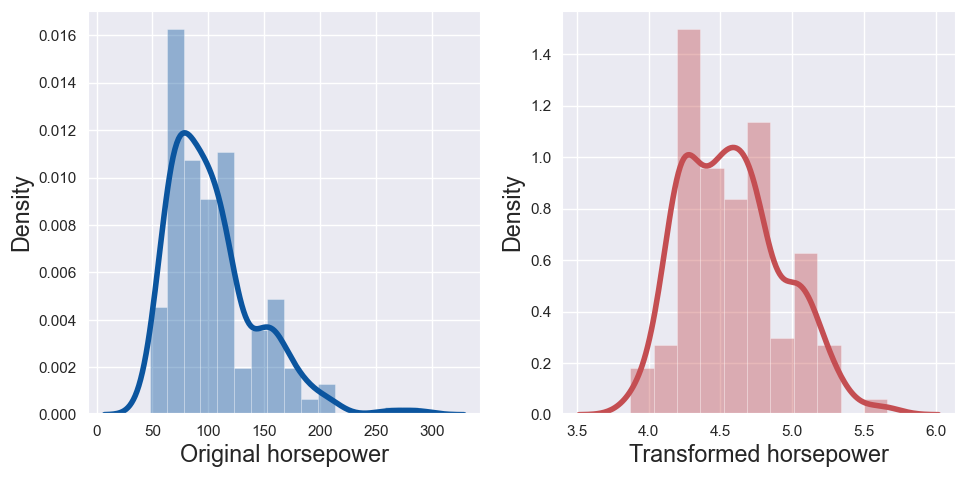


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'carwidth' . Skewness = 0.90


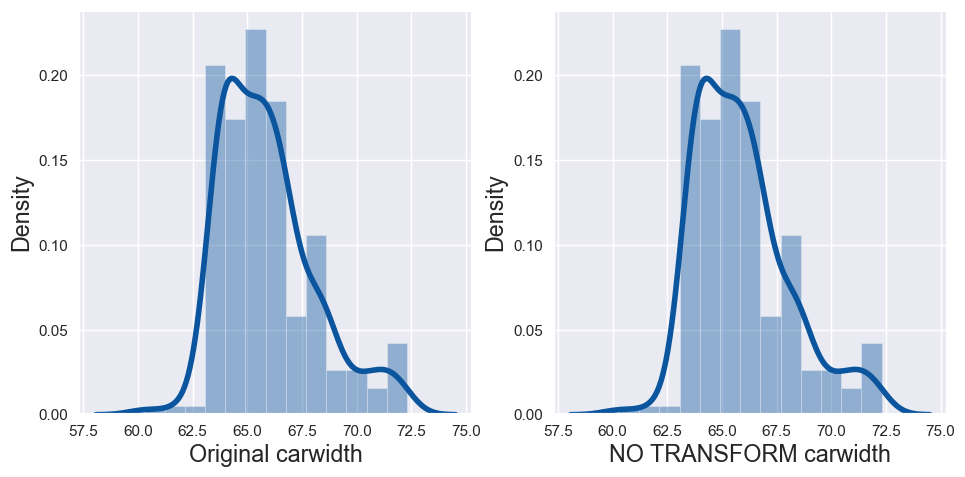


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'highwaympg' . Skewness = 0.54


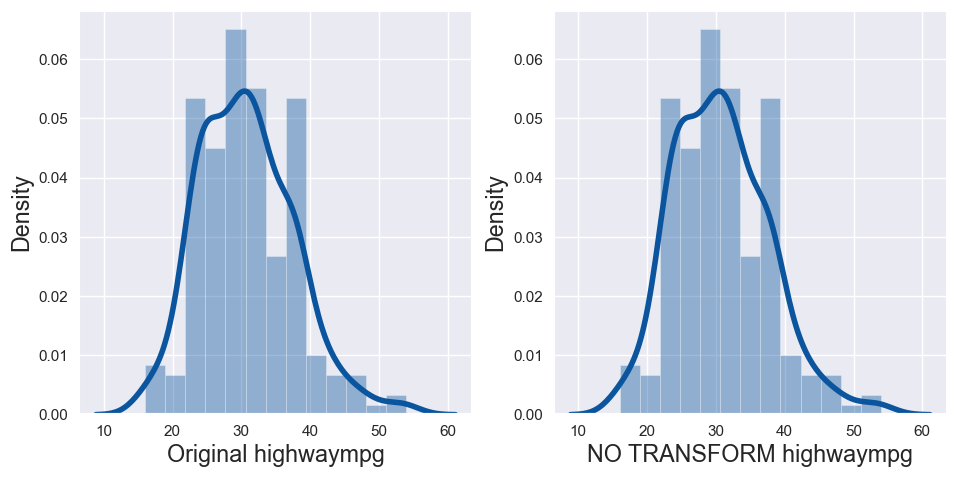


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'curbweight' . Skewness = 0.68


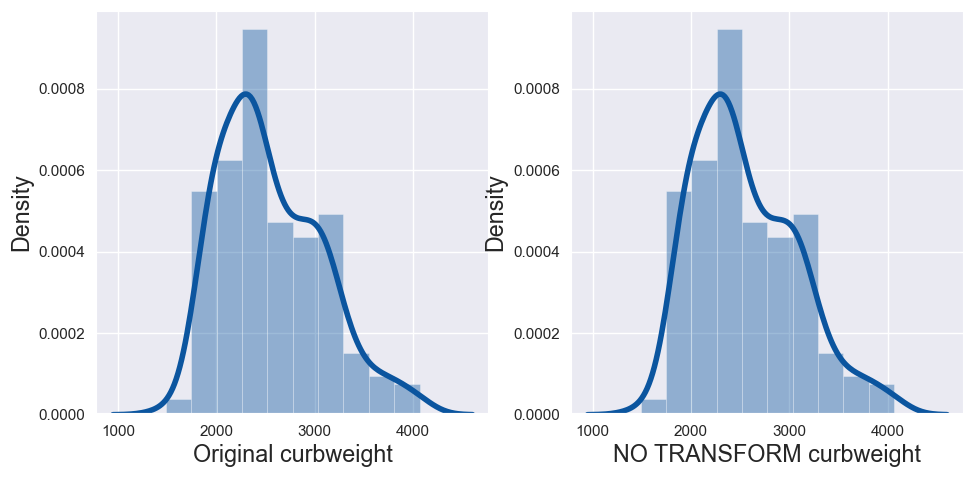


 ------------------------------------------------------

 'wheelbase' had 'positive' skewness of 1.05

 Transformation yielded skewness of 0.88


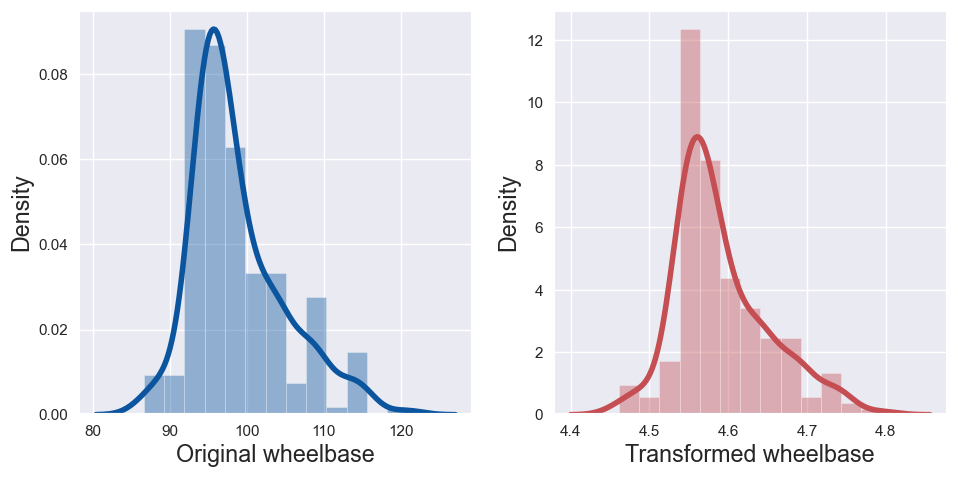


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'stroke' . Skewness = -0.69


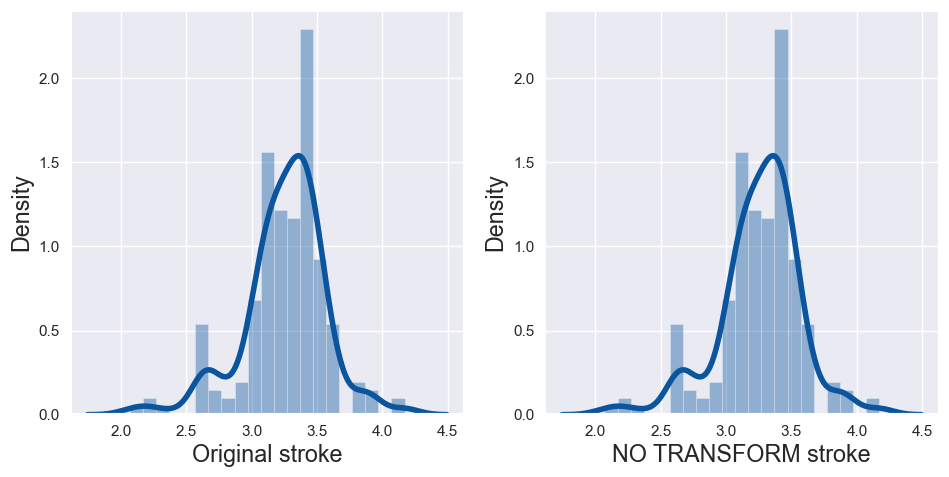


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'boreratio' . Skewness = 0.02


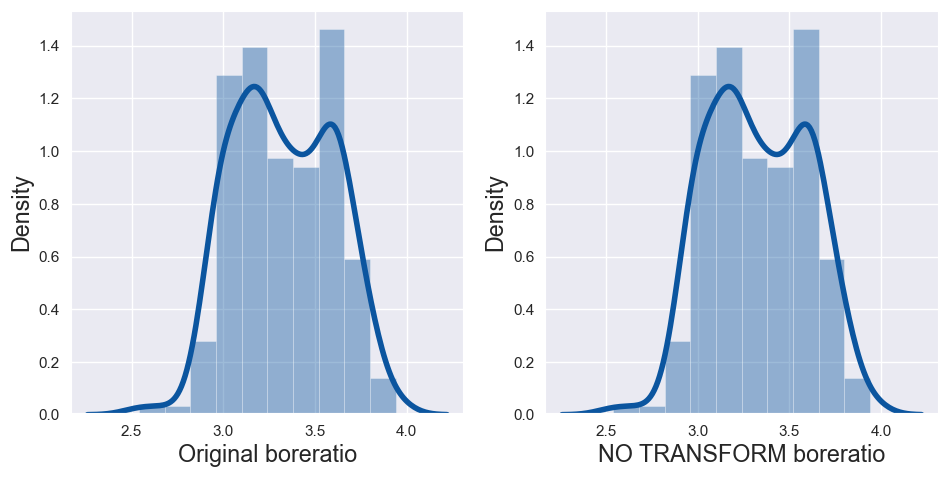


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'carlength' . Skewness = 0.16


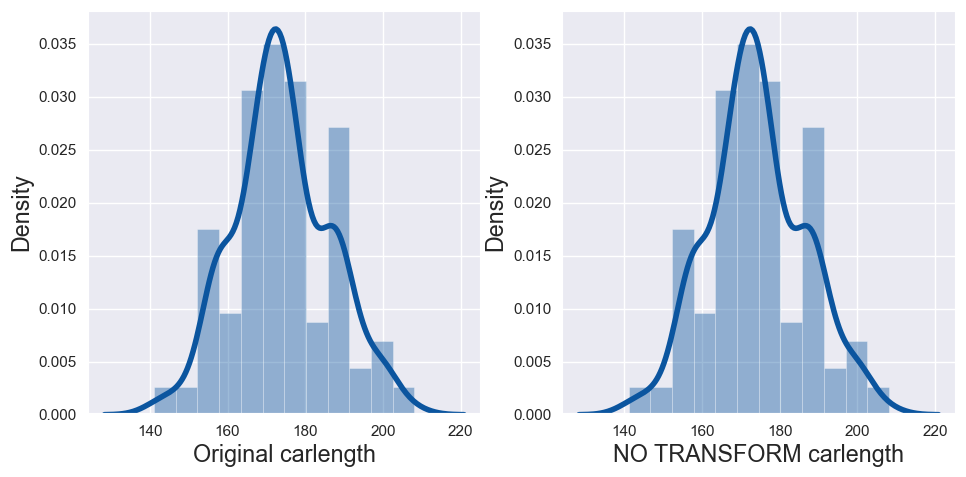

In [27]:
# Auto skew transform
df= skew_autotransform(df.copy(deep=True), include=quant_features,plot = True, exp = True, threshold = 1)

##*Outliers*

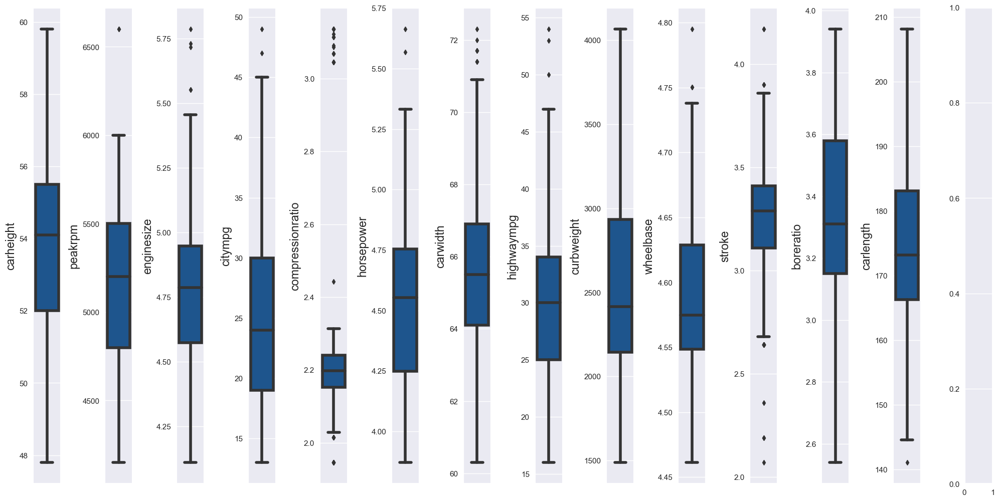

In [28]:
# Outliers detection

fig, ax = plt.subplots(ncols = 14, nrows = 1, figsize = (20, 10))
index = 0
ax = ax.flatten()

for col, value in df[quant_features].items():
    sns.boxplot(y=col, data=df, ax=ax[index])
    index += 1
plt.tight_layout(pad = 0.5, w_pad=0.7, h_pad=5.0)

In [29]:
# Tukey Rule outliers
# As an alternative, you could use z-scores greater than 3 or less than -3.

#Tukey's method
def tukey_rule(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_lim = data[col].quantile(0.5) + 2 * IQR
    lower_lim = data[col].quantile(0.5) - 2 * IQR
    outliers = []
    for index, x in enumerate(data[col]):
        if x < lower_lim or x >= upper_lim:
            outliers.append(index)
    return outliers

# Identify outliers
X=df
for i in quant_features:
  outliers_Tukey = tukey_rule(X,i)
  
# Winsorize X and check the results
X_winsorized = X.copy(deep=True)
for i in quant_features:
  X_winsorized[i] = winsorize(X[i], limits=(0.05, 0.05))

In [30]:
# Update df
df[quant_features] = X_winsorized[quant_features]

##*Automated Visualizations*

                                             |      | [  0%]   00:00 -> (? left)


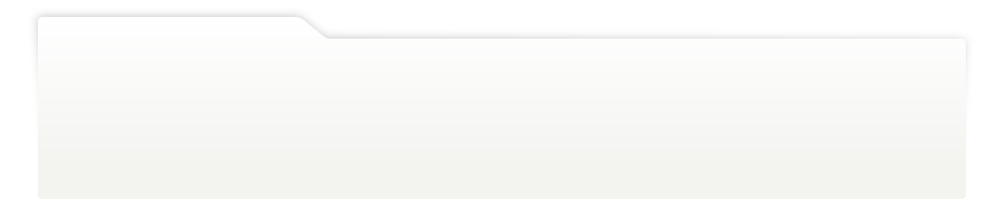
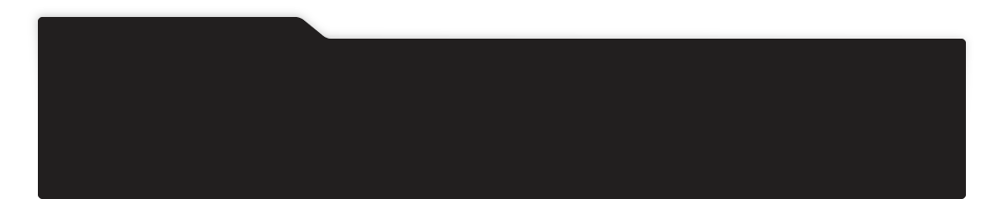
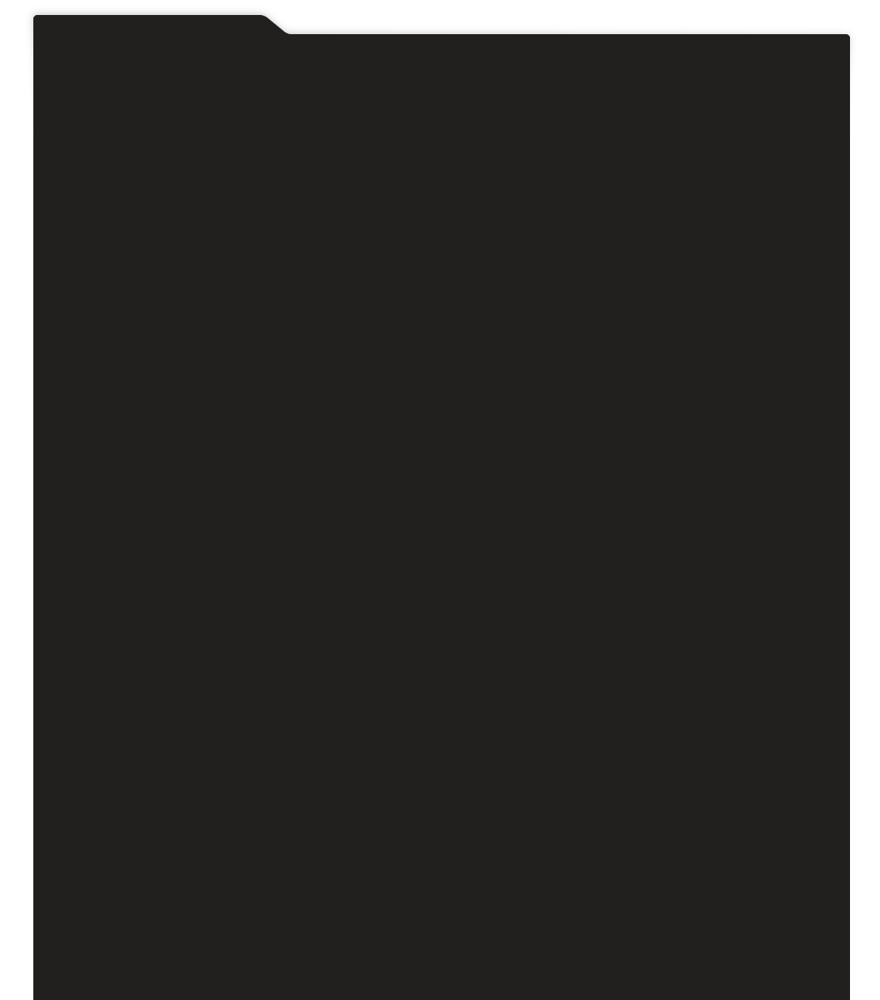
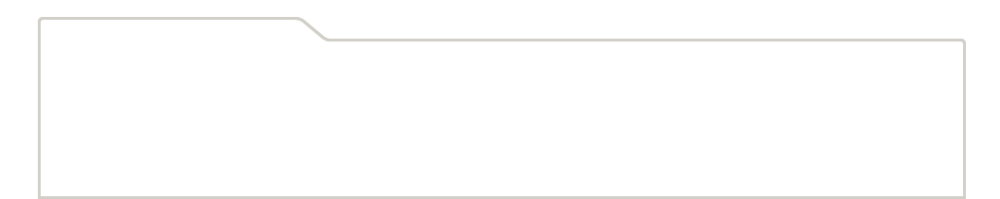
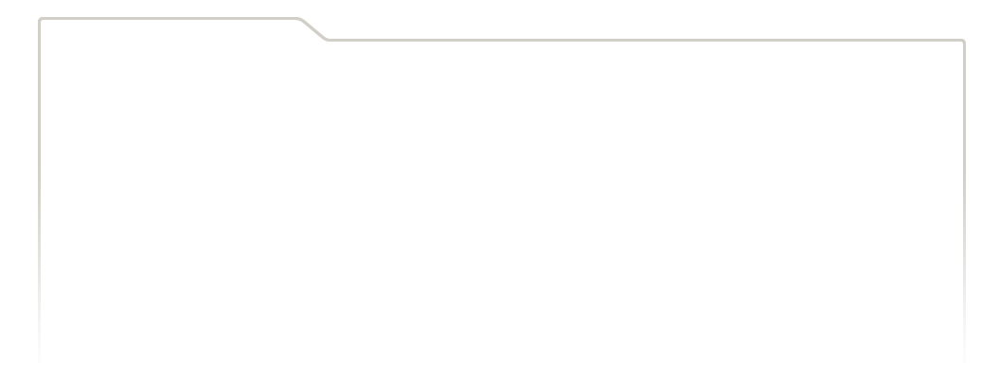
...
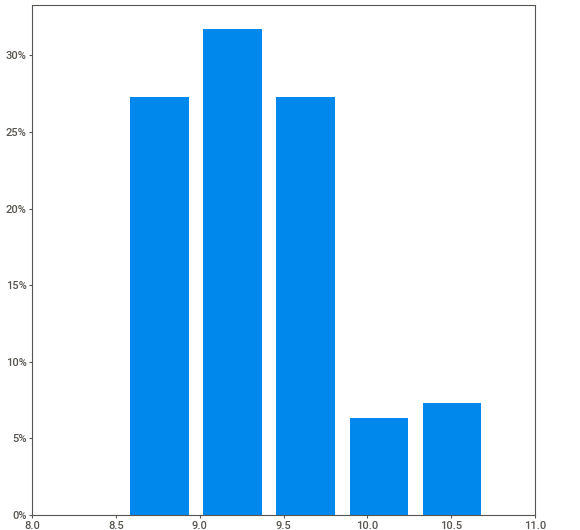
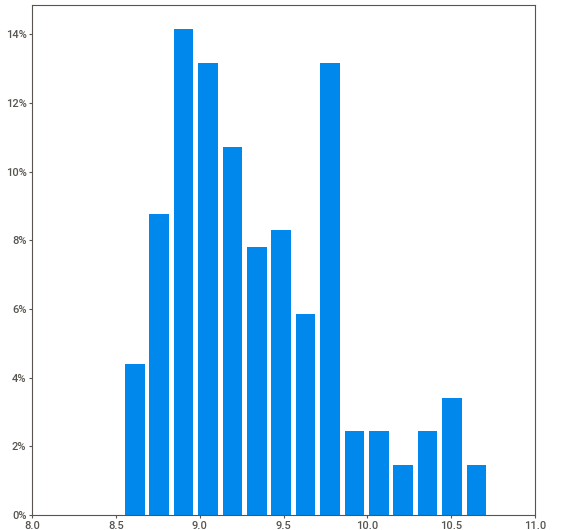
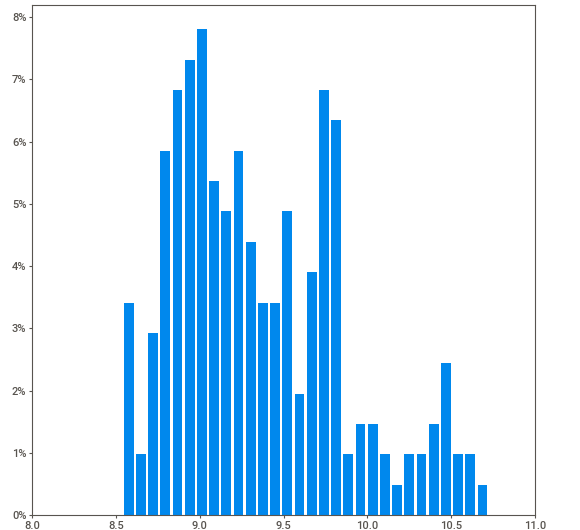
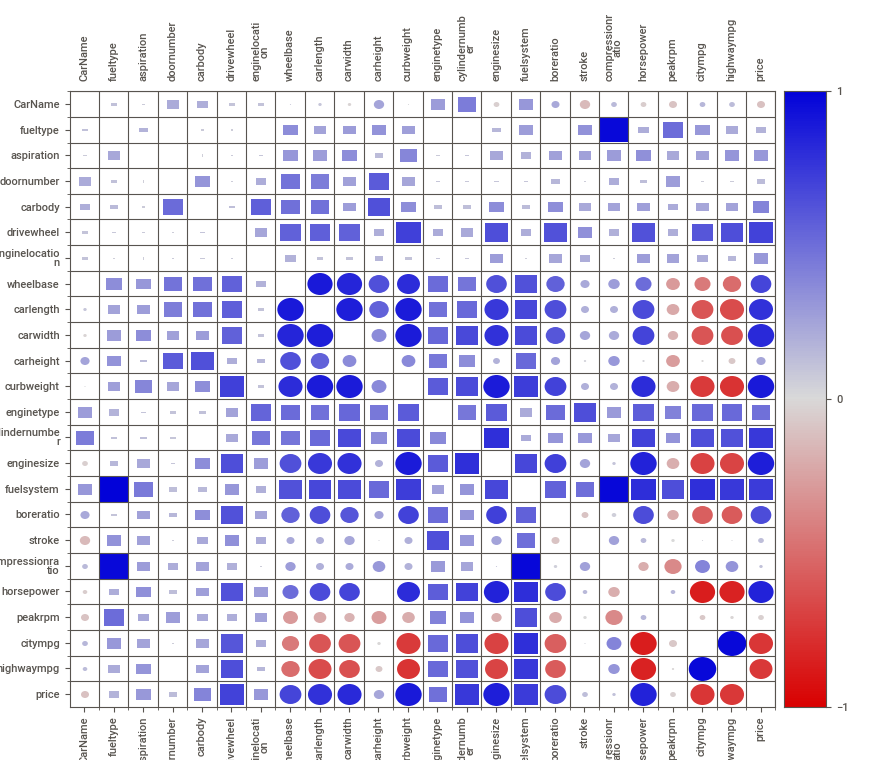
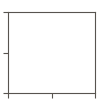

In [31]:
# Sweetviz as an example of automated visualization
vizreport = sv.analyze(df)           
vizreport.show_notebook(layout='widescreen', w=1500, h=300, scale=0.7) #widescreen layout
#vizreport.show_notebook(layout='vertical', w=800, h=300, scale=0.7)   #vertical layout

In [32]:
# create an AutoViz class
AV = AutoViz_Class()

Shape of your Data Set loaded: (205, 24)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
CarName,0.000000,71.707317,int64,147,0,0,
enginetype,0.000000,3.414634,int64,7,0,0,
citympg,0.000000,10.731707,int64,22,0,0,
peakrpm,0.000000,9.756098,int64,20,0,0,
horsepower,0.000000,23.414634,float64,48,0,0,
compressionratio,0.000000,13.170732,float64,27,0,0,right skewed distribution: cap or drop outliers
stroke,0.000000,15.121951,float64,31,0,0,
boreratio,0.000000,15.609756,float64,32,0,0,
fuelsystem,0.000000,3.902439,int64,8,0,0,
enginesize,0.000000,16.585366,float64,34,0,0,


    23 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Regression problem #####################
Number of variables = 23 exceeds limit, finding top 15 variables through XGBoost
    No categorical feature reduction done. All 14 Categorical vars selected 
    Removing correlated variables from 9 numerics using SULO method

After removing highly correlated variables, following 6 numeric vars selected: ['carheight', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'carwidth']
    Adding 14 categorical variables to reduced numeric variables  of 6
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 20 
    Finding Important Features using Boosted Trees algorithm...
        using 20 variables...
        using 16 variables...
        using 12 variables...
        using 8 variables...
        using 4 variables...
Found 16 important features
    Since numbe

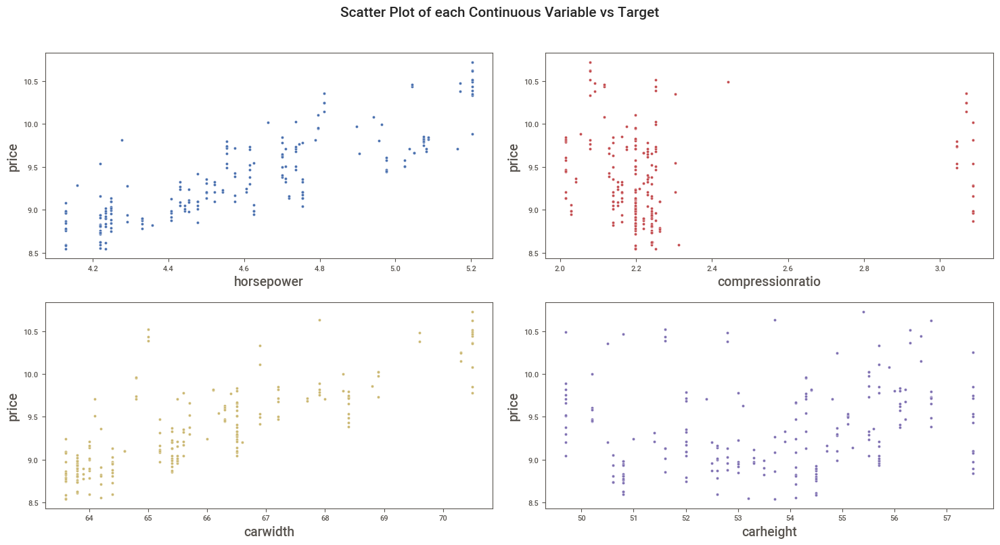

Number of All Scatter Plots = 10


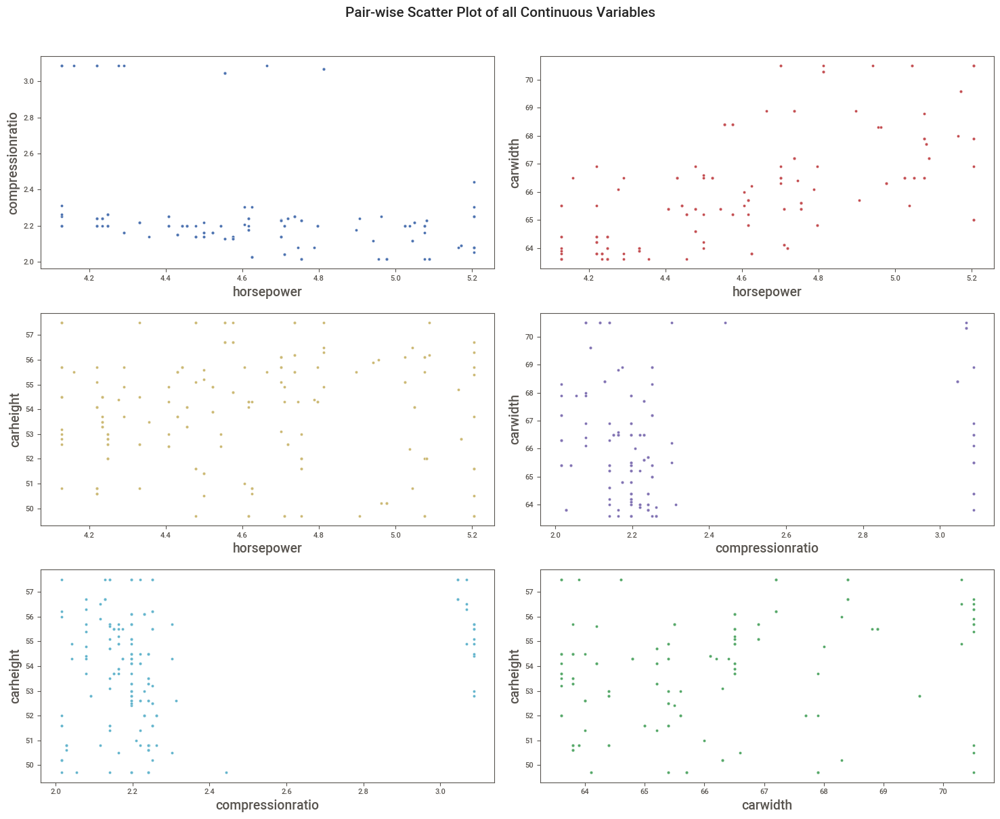

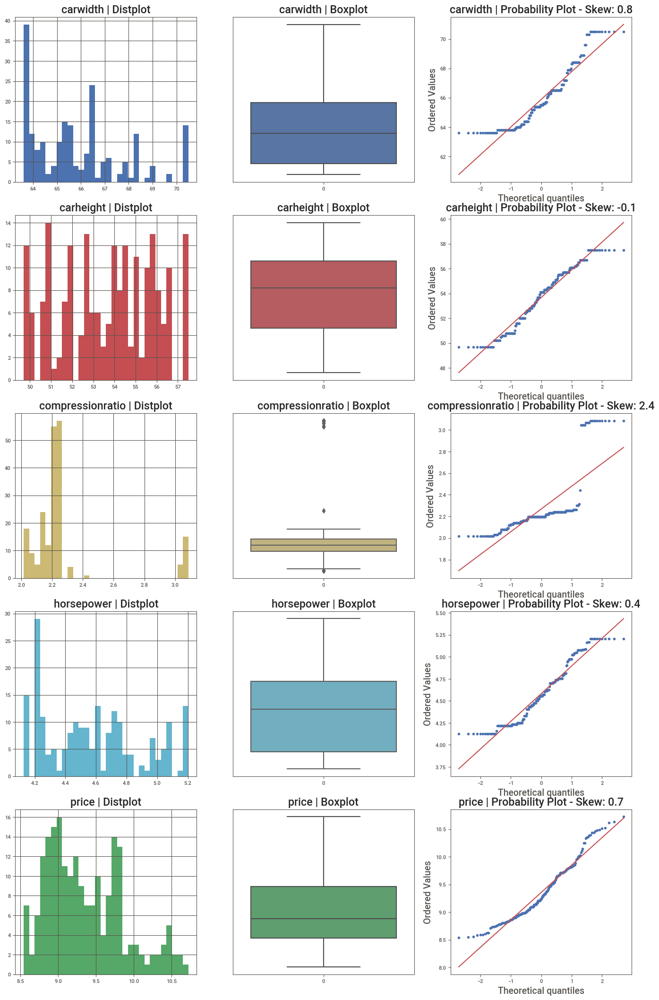

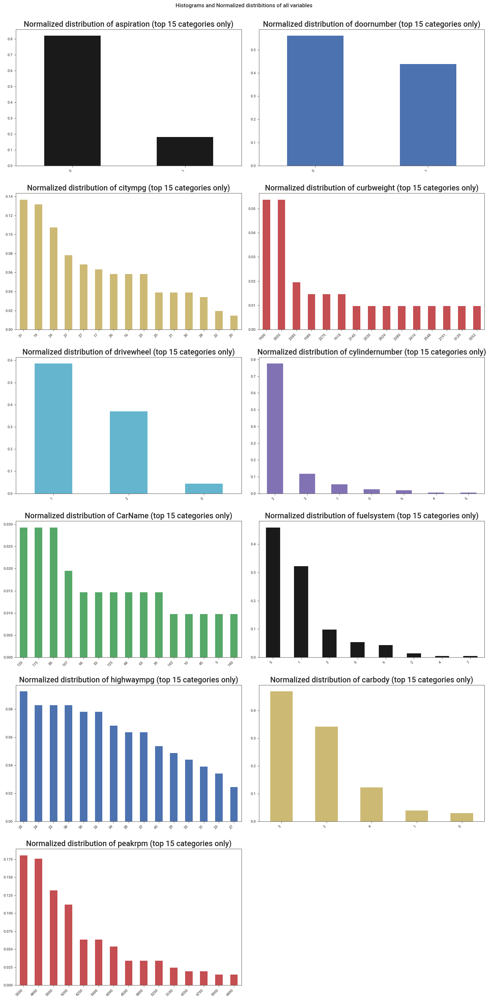

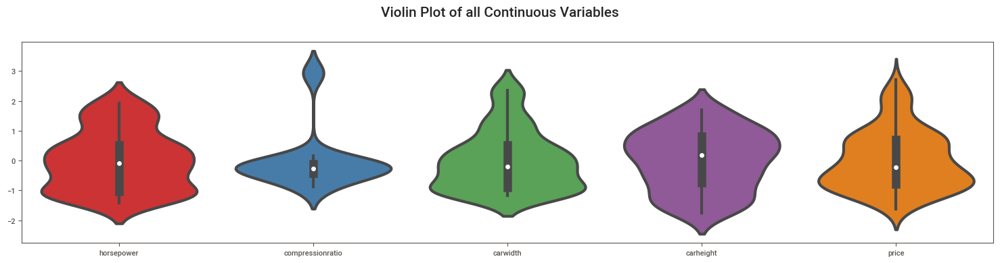

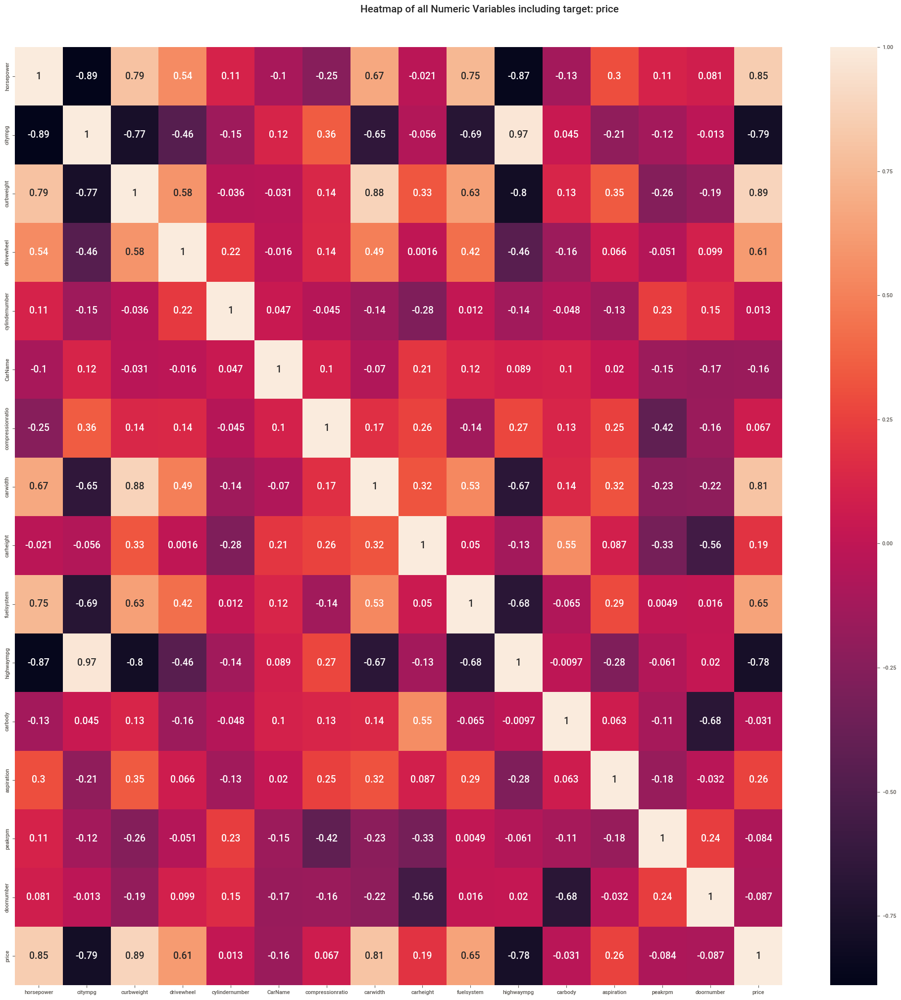

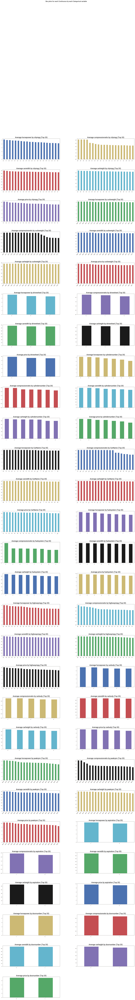

All Plots done
Time to run AutoViz = 6 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [33]:
# Create AutoViz charts
%matplotlib inline
dftc = AV.AutoViz(filename='', sep ='' , depVar = 'price', dfte = df, header = 0,
verbose = 1, lowess = False, chart_format ='png', max_rows_analyzed = 1200, max_cols_analyzed = 15)

##*Split df to get X and y*

In [34]:
# Split Predictors & Target
X = pd.DataFrame(df.drop(['price'],axis=1))
y = pd.DataFrame(df['price']) 
print('X:\n',X.head())
print('\ny\n',y.head())

X:
    CarName  fueltype  aspiration  doornumber  carbody  drivewheel  \
0        2         1           0           1        0           2   
1        3         1           0           1        0           2   
2        1         1           0           1        2           2   
3        4         1           0           0        3           1   
4        5         1           0           0        3           0   

   enginelocation  wheelbase  carlength  carwidth  ...  cylindernumber  \
0               0   4.532599      168.8      64.1  ...               2   
1               0   4.532599      168.8      64.1  ...               2   
2               0   4.548600      171.2      65.5  ...               3   
3               0   4.603168      176.6      66.2  ...               2   
4               0   4.599152      176.6      66.4  ...               1   

   enginesize  fuelsystem  boreratio  stroke  compressionratio  horsepower  \
0    4.867534           5       3.47    2.68          2.19

##*Holdout Sample & Scaling*

In [35]:
col_names = X.columns

In [36]:
stdsc1 = StandardScaler()  
X_tr_std = stdsc1.fit_transform(X)
# X_tst_std = stdsc1.transform(X_tst)
stdsc2 = StandardScaler()
y_tr_std = stdsc2.fit_transform(y)
# y_tst_std = stdsc2.transform(y_tst)￼

In [37]:
X.columns

Index(['CarName', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize',
       'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm', 'citympg', 'highwaympg'],
      dtype='object')

##*Scaling*

In [38]:
#Do the predictors need to be scaled?
#Yes，I think the predictors need to be scaled

##*PCA*

In [39]:
#Create a PCA object with the desired number of components
pca = PCA(n_components=5)

# Scale predictors
stdsc = StandardScaler()  
X_pca = pd.DataFrame(stdsc.fit_transform(X))
print("Checking: mean of column 0 of X_pca:",X_pca[0].mean(), " and its std deviation:", X_pca[0].std())

# Examine the explained variance ratio in order for each components
pca = PCA()
X_pca = pca.fit_transform(X_pca)
pca.explained_variance_ratio_

pca_explained_variance_bar(pca, alpha=0.8)
%matplotlib inline
plt.show()

Checking: mean of column 0 of X_pca: 0.0  and its std deviation: 1.002447984079131


##*Feature Importance*

<BarContainer object of 23 artists>

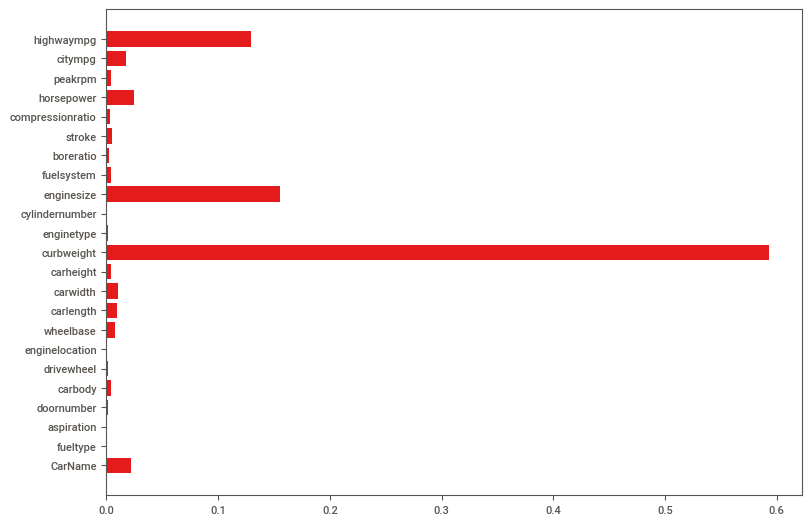

In [40]:
# Feature Importance
# Code adapted from this source: https://machinelearningmastery.com/calculate-feature-importance-with-python/
# Let's try to weed out the really poor predictors
from matplotlib import pyplot                            # Import pyplot (to be able generate the barchart later in this snippet)
plt.rcParams["figure.figsize"] = (8,6)
model = RandomForestRegressor()                         # Create an instance of a RandomForestClassifier
# fit the model
model.fit(X_tr_std, np.ravel(y_tr_std))                  # Fit the RandomForest instance using the traiing data
# get importance 
importance = model.feature_importances_                  # The RandomForestClassifier instance computes feature importance as a bonus. Store them imprtance values in importance'.
# summarize feature importance
plt.barh(col_names, model.feature_importances_) 

#**M5 Regression**
The M5 Hackathon begins here! Enjoy!

,Description,Value
0,Session id,123
1,Target,price
2,Target type,Regression
3,Original data shape,"(205, 24)"
4,Transformed data shape,"(205, 5)"
5,Transformed train set shape,"(143, 5)"
6,Transformed test set shape,"(62, 5)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.1225,0.0263,0.1607,0.8996,0.0153,0.0129,0.0720
et,Extra Trees Regressor,0.1252,0.0303,0.1690,0.8848,0.0161,0.0132,0.0440
rf,Random Forest Regressor,0.1316,0.0321,0.1746,0.8741,0.0166,0.0139,0.0440
gbr,Gradient Boosting Regressor,0.1326,0.0337,0.1803,0.8678,0.0172,0.0141,0.0360
xgboost,Extreme Gradient Boosting,0.1332,0.0349,0.1840,0.8636,0.0175,0.0141,0.0360
ada,AdaBoost Regressor,0.1471,0.0369,0.1890,0.8556,0.0180,0.0156,0.0380
knn,K Neighbors Regressor,0.1577,0.0417,0.2023,0.8348,0.0192,0.0166,0.0280
lightgbm,Light Gradient Boosting Machine,0.1554,0.0453,0.2114,0.8237,0.0200,0.0164,0.0280
lr,Linear Regression,0.1678,0.0491,0.2203,0.8102,0.0209,0.0177,0.3240
br,Bayesian Ridge,0.1684,0.0491,0.2203,0.8101,0.0209,0.0178,0.0300


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1069,0.0185,0.1360,0.9100,0.0132,0.0115
1,0.1360,0.0366,0.1914,0.8251,0.0181,0.0144
2,0.1510,0.0368,0.1919,0.8707,0.0182,0.0159
3,0.1493,0.0373,0.1932,0.8698,0.0186,0.0160
4,0.1300,0.0346,0.1859,0.8901,0.0173,0.0134
Mean,0.1347,0.0328,0.1797,0.8731,0.0171,0.0142
Std,0.0160,0.0072,0.0220,0.0282,0.0020,0.0017


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

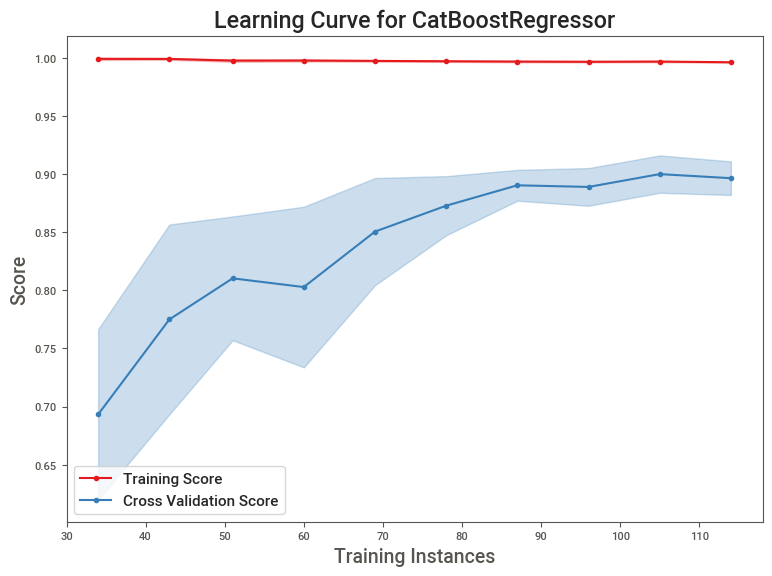

In [41]:
# PyCaret Low-Code Regressor

# initialize setup
regression = setup(data=df, target='price',fold=5,
                   numeric_features=quant_features, normalize=True,
                   feature_selection=True, session_id = 123)

# Compare multiple models and select the best one
best_model = compare_models(sort='MSE')   # run the horse race

# Tune the model using a grid search
tuned_model = tune_model(best_model)  #tune hyperparameters of the best model

# Evaluate the performance of the tuned model
evaluate_model(tuned_model)            # Get KPIs of muned model

# plot learning curve
plot_model(tuned_model, plot='learning')    # Plot the learning curve
%matplotlib inline
plt.show()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.1120,0.0282,0.1678,0.8353,0.0159,0.0120


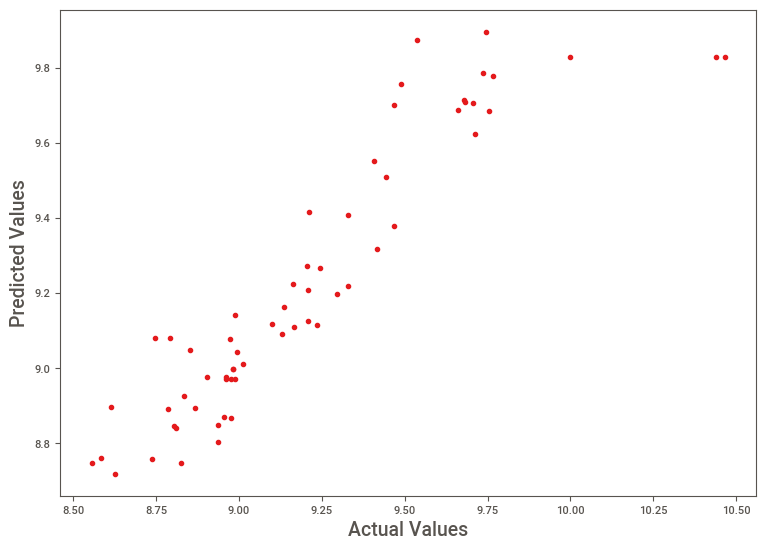

In [42]:
# Graph actual vs predicted for tuned PyCaret model
# make predictions
predictions = predict_model(tuned_model)

# plot actuals versus predicted values
plt.scatter(predictions['price'], predictions['prediction_label'])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,0.1120,0.0282,0.1678,0.8353,0.0159,0.0120


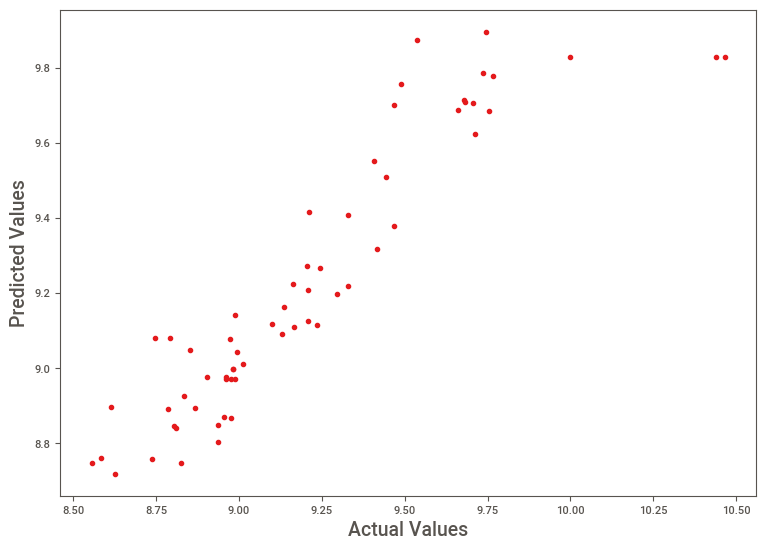

In [43]:
# Graph actual vs predicted for tuned PyCaret model
# make predictions
predictions = predict_model(tuned_model)

# plot actuals versus predicted values
plt.scatter(predictions['price'], predictions['prediction_label'])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [44]:
# Report performance
def Performance(actuals,predictions):
  print('MSE: %.2f ' % mean_squared_error(actuals, predictions))
  print('MAE: %.2f ' % mean_absolute_error(actuals,predictions)) 
  print('R^2: %.2f' % r2_score(actuals, predictions))

# Plotting the actuals vs predictions 
def PredsVsActuals(actuals,predictions):
  plt.plot(actuals, predictions, '.', color='blue')
  plt.xlabel('Actuals')
  plt.ylabel('Predictions')
  plt.show()

## Scale the data and split the data into training and testing set

In the encodings above, carbody and drivewheel are not correctly taken account of thus not qualified for a regression model. Thus, we need to re-encode the two columns to correctly specify them as categorical variables.

In [45]:
df = pd.get_dummies(data=df, columns=['carbody'], drop_first=True)
df = pd.get_dummies(data=df, columns=['drivewheel'], drop_first=True)

In [46]:
# Create holdout sample
# Note: split before doing any trasformations on the data!!!

X_train, X_test, y_train, y_test =\
    train_test_split(X, y, 
                     test_size=0.2,    # 80-20 training vs test set split
                     random_state=0)
print('Shape of X and y',X.shape, y.shape, '\nShape of training set X and y',X_train.shape, y_train.shape, '\nShape of test set X and y',X_test.shape, y_test.shape) 
stdsc1 = StandardScaler()  
X_train_std = stdsc1.fit_transform(X_train)
X_test_std = stdsc1.transform(X_test)
stdsc2 = StandardScaler()  
y_train_std = stdsc2.fit_transform(y_train)
y_test_std = stdsc2.transform(y_test)

Shape of X and y (205, 23) (205, 1) 
Shape of training set X and y (164, 23) (164, 1) 
Shape of test set X and y (41, 23) (41, 1)


## Base Regression models

REGRESSOR:  Multiple Linear Regression 

Coefficients: 
 [-0.13081532  0.0490565  -0.00862583 -0.05745555 -0.08408987  0.06163459
  0.17498327  0.10973367  0.10215051  0.10993112  0.00327753  0.26513575
  0.02031808 -0.00761002  0.00102061  0.04311392 -0.08377513 -0.10434748
  0.19156876  0.32325307 -0.00546943 -0.27742128  0.17605528]
MSE: 0.04 
MAE: 0.15 
R^2: 0.87


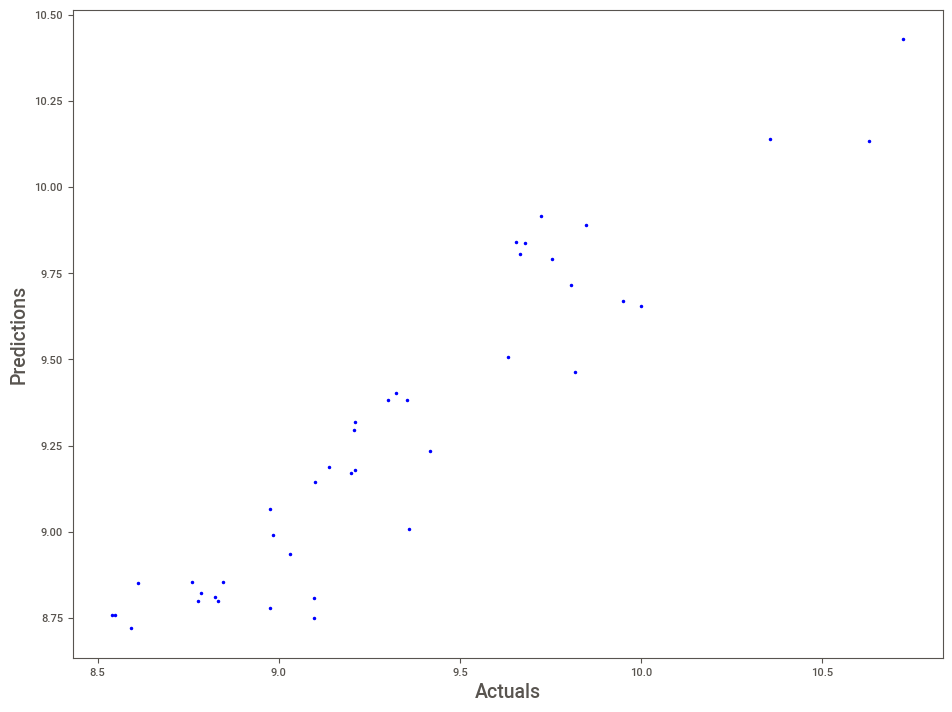

Maximum error:  2.7617347887463453 %


REGRESSOR:  Lasso Regression 

Coefficients: 
 [-0.         -0.          0.         -0.         -0.          0.
  0.          0.          0.          0.          0.          0.24795819
  0.          0.          0.06819747  0.          0.          0.
  0.          0.09463489 -0.         -0.         -0.        ]
MSE: 0.13 
MAE: 0.29 
R^2: 0.54


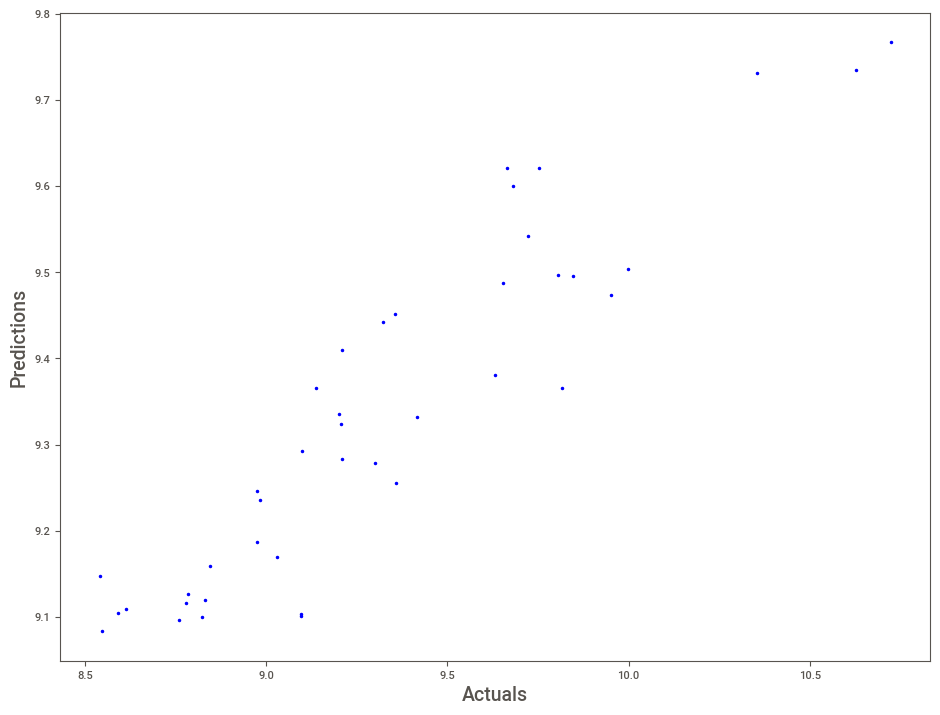

Maximum error:  7.112020855052616 %


REGRESSOR:  Ridge Regression 

Coefficients: 
 [-0.13170661  0.02097481 -0.00745036 -0.05814964 -0.08580204  0.06392591
  0.17528389  0.1028845   0.10933388  0.11591803  0.00523635  0.25390045
  0.02047483 -0.00255717  0.01894848  0.04669652 -0.08348784 -0.1060417
  0.15734768  0.30430131  0.00062055 -0.24111011  0.14300096]
MSE: 0.04 
MAE: 0.15 
R^2: 0.87


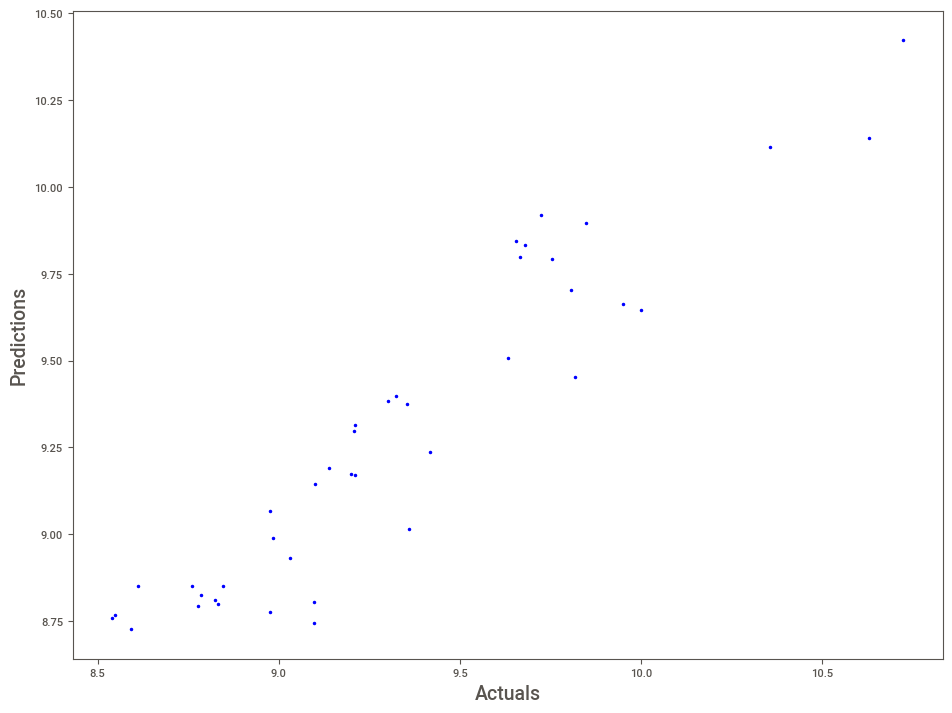

Maximum error:  2.7822875690391666 %


REGRESSOR:  ElasticNet Regression 

Coefficients: 
 [-0.         -0.          0.         -0.         -0.          0.04576764
  0.056302    0.          0.04213839  0.13537087  0.          0.21272633
  0.          0.          0.15231523  0.          0.         -0.
  0.          0.18410546  0.         -0.07464999 -0.        ]
MSE: 0.05 
MAE: 0.19 
R^2: 0.81


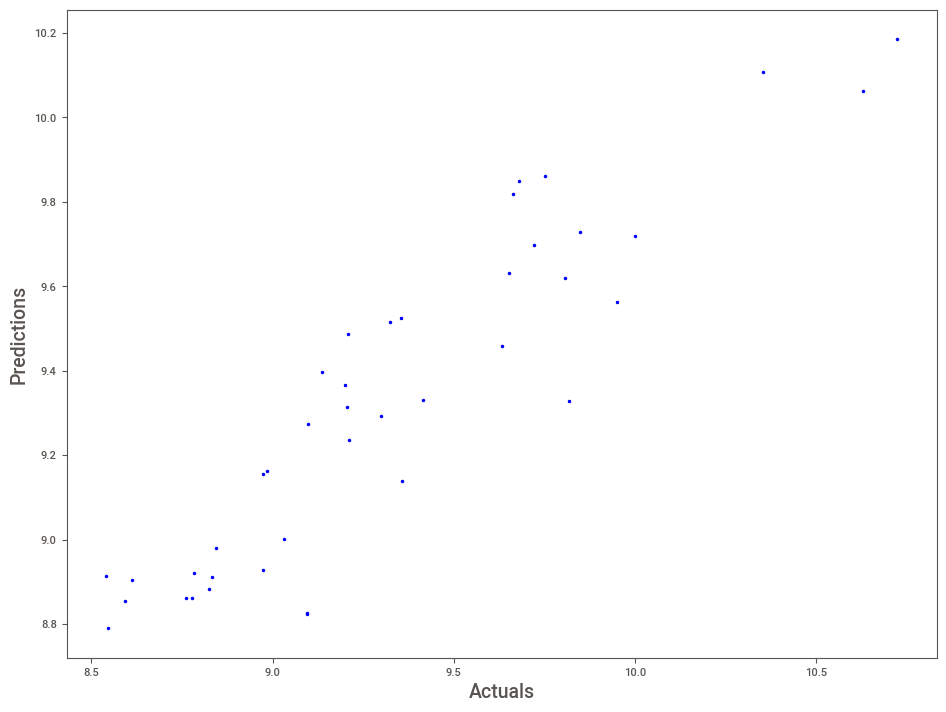

Maximum error:  4.3745152518015304 %


REGRESSOR:  kNN 

MSE: 0.06 
MAE: 0.17 
R^2: 0.80


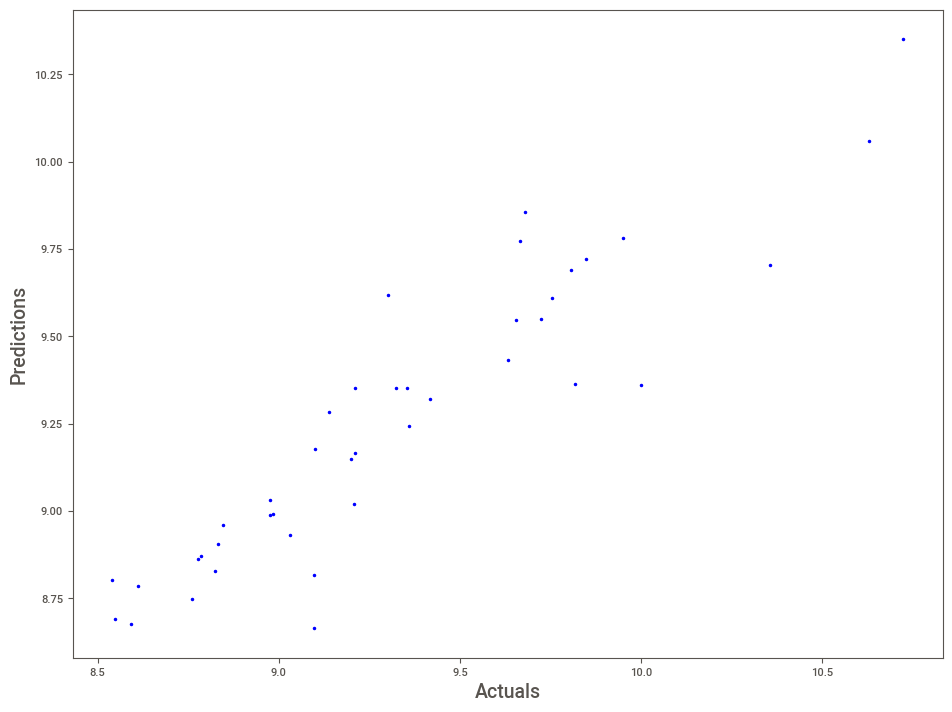

Maximum error:  3.4116747455844365 %


REGRESSOR:  SVR 

MSE: 0.05 
MAE: 0.16 
R^2: 0.83


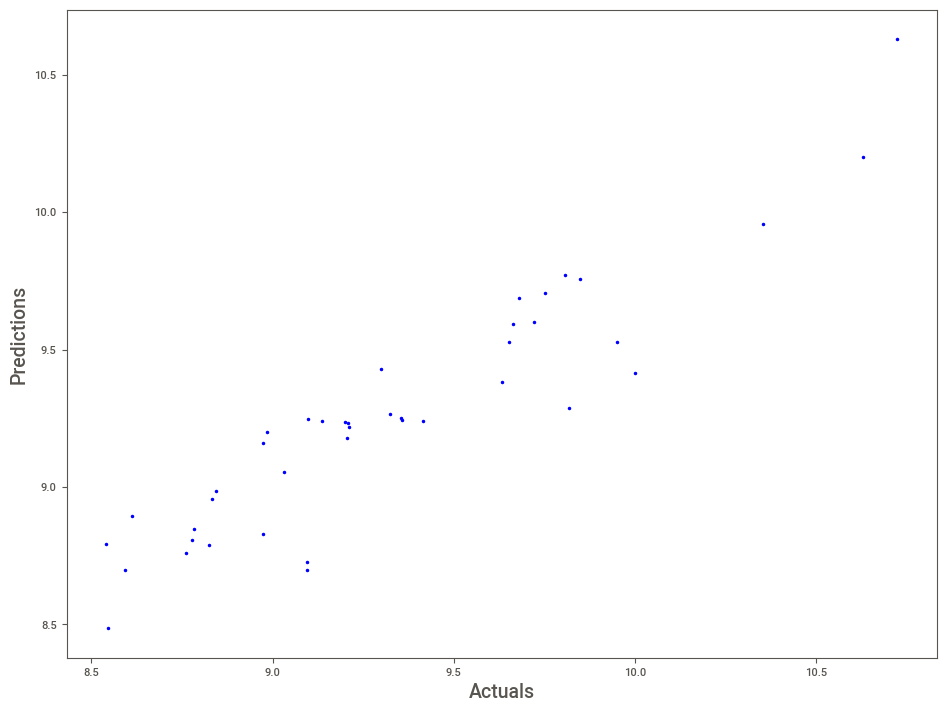

Maximum error:  3.2756472310329707 %


REGRESSOR:  Decision Tree 

MSE: 0.05 
MAE: 0.16 
R^2: 0.84


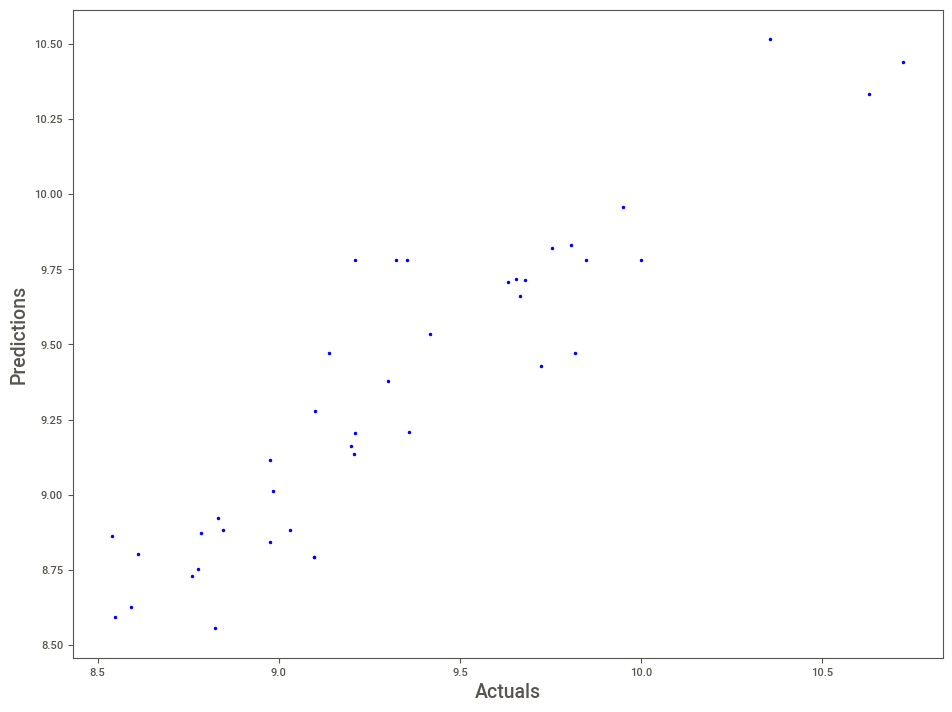

Maximum error:  6.192449205041931 %


REGRESSOR:  Multilayer Perceptron 

MSE: 0.48 
MAE: 0.52 
R^2: -0.67


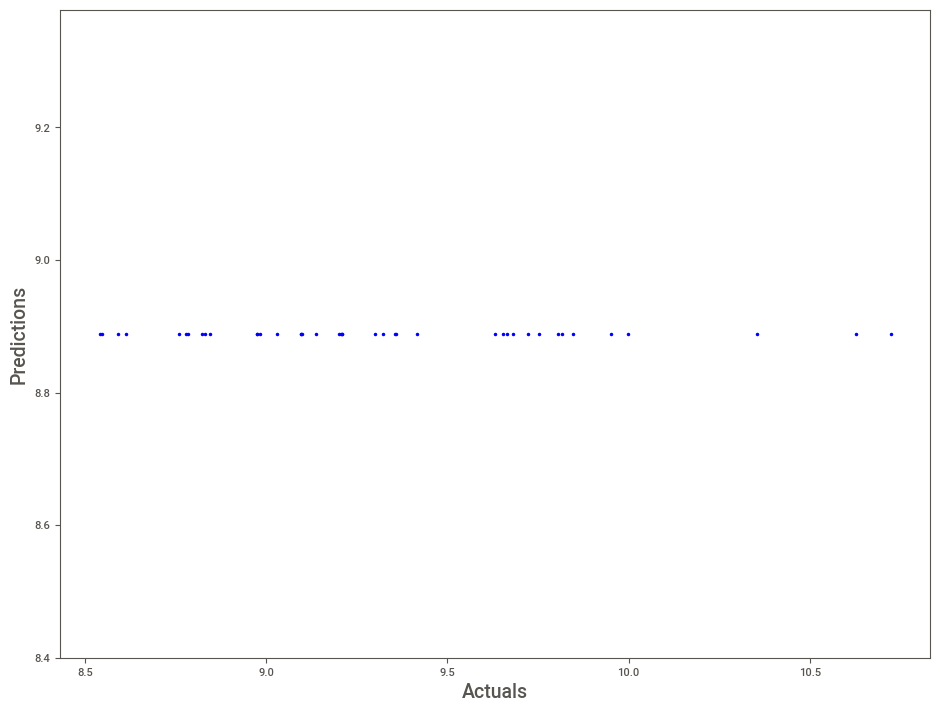

Maximum error:  4.074416826782636 %




In [47]:
# Loop through base learners
names = ['Multiple Linear Regression', 'Lasso Regression', 'Ridge Regression','ElasticNet Regression','kNN', 'SVR','Decision Tree','Multilayer Perceptron']
regressors = [linear_model.LinearRegression(),
              Lasso(alpha=0.5),
              Ridge(alpha=0.5),
              ElasticNet(alpha=0.25, l1_ratio=0.5),
              KNeighborsRegressor(n_neighbors=5),
              SVR(kernel = 'poly'),   #Can try kernels 'poly', 'linear' and 'sigmoid' kernels
              DecisionTreeRegressor(),
              MLPRegressor(hidden_layer_sizes=(150,150,1),
                       max_iter = 300,activation = 'relu',         
                       solver = 'adam')] 

for name, regr in zip(names, regressors):
  print('REGRESSOR: ',name,'\n')
  regr.fit(X_train_std, np.ravel(y_train_std))
  # Make predictions 
  y_pred_std = regr.predict(X_test_std)
  y_pred_std = pd.DataFrame(y_pred_std)
  y_pred = stdsc2.inverse_transform(y_pred_std)
  if name in ['Multiple Linear Regression', 'Lasso Regression', 'Ridge Regression','ElasticNet Regression']:
      print('Coefficients: \n', regr.coef_)
  # Performance
  plt.figure(figsize=(10,8))
  Performance(y_test,y_pred)
  PredsVsActuals(y_test,y_pred)
  # Worst-case instance prediction
  y_pred = pd.DataFrame(y_pred) 
  results = pd.concat([y_pred, y_test.set_index(y_pred.index)], axis=1)
  results.columns=['Pred','Act']
  results['error'] = (results.Pred - results.Act)/results.Act
  print('Maximum error: ',100*np.max(results.error),'%\n\n')

### Keras Model

In [48]:
# Keras Deep Learning model definition
def BuildModel():
 model = Sequential()
 model.add(Dense(50, input_dim=23,activation='relu')) 
 model.add(Dense(50, activation='relu')) 
 model.add(Dense(1,activation='linear'))
 model.compile(loss="mean_squared_error", optimizer="adam")   
 return model
 # Instantiate the model
model = BuildModel()

# Train the model
model.fit(X_train_std, y_train_std, epochs=1000, batch_size=32, verbose=0)

# Make predictions on the testing data
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean squared error:", mse)
print("R-squared:", r2)


Metal device set to: Apple M2


2023-04-27 14:07:30.729941: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-27 14:07:30.730030: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-04-27 14:07:30.879455: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-27 14:07:31.045239: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 0s 12ms/step
Mean squared error: 10273096.681480123
R-squared: -35992837.04577884


2023-04-27 14:07:49.729272: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


The Keras sequential model has overfitted. We use the feature selection to try fitting it with less variable.

In [49]:
selected_cols = ['highwaympg','enginesize', 'curbweight']
Krs_X, Krs_Y, Krs_Xtest, Krs_Ytest = X_train[selected_cols], y_train, X_test[selected_cols], y_test
KrsX_train_std = stdsc1.fit_transform(Krs_X)
KrsX_test_std = stdsc1.transform(Krs_Xtest)

In [50]:
# Keras Deep Learning model definition
def BuildModel():
 model = Sequential()
 model.add(Dense(50, input_dim=3,activation='relu')) 
 model.add(Dense(50, activation='relu')) 
 model.add(Dense(1,activation='linear'))
 model.compile(loss="mean_squared_error", optimizer="adam")   
 return model
 # Instantiate the model
model = BuildModel()

# Train the model
model.fit(KrsX_train_std, y_train_std, epochs=500, batch_size=32, verbose=0)

# Make predictions on the testing data
y_pred = model.predict(Krs_Xtest)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean squared error:", mse)
print("R-squared:", r2)


2023-04-27 14:07:49.922824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 0s 10ms/step
Mean squared error: 141.069336727617
R-squared: -493.2507549078189


2023-04-27 14:07:59.770629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


MLP is not a good option here.

### Comparison

REGRESSOR:  XGBoost 

MSE: 0.03 
MAE: 0.14 
R^2: 0.89


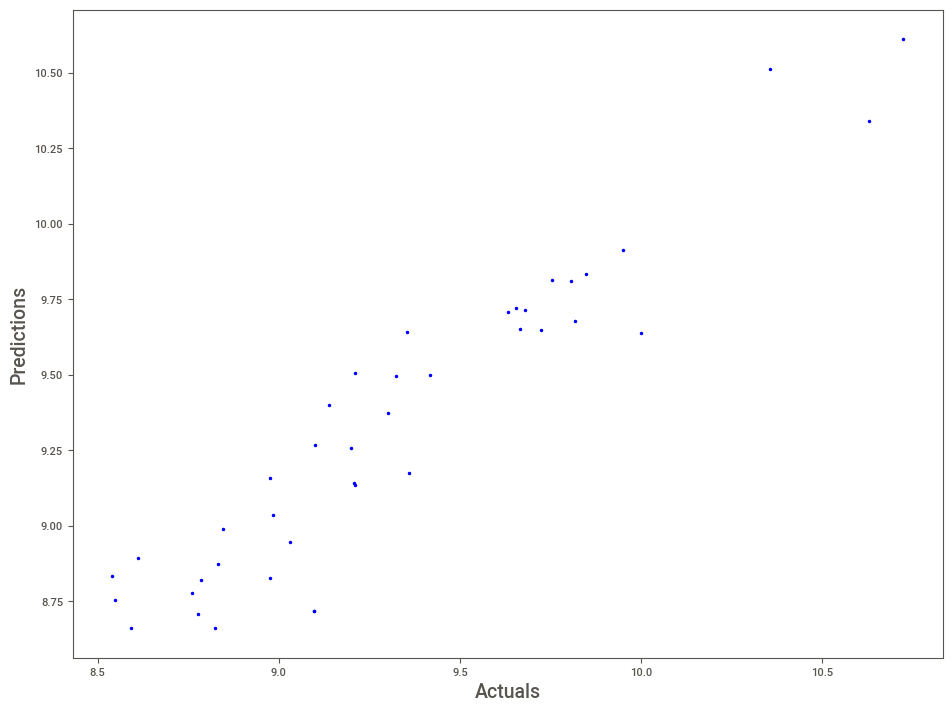

Maximum error:  3.4363557936155247 %


REGRESSOR:  AdaBoost 

MSE: 0.03 
MAE: 0.15 
R^2: 0.88


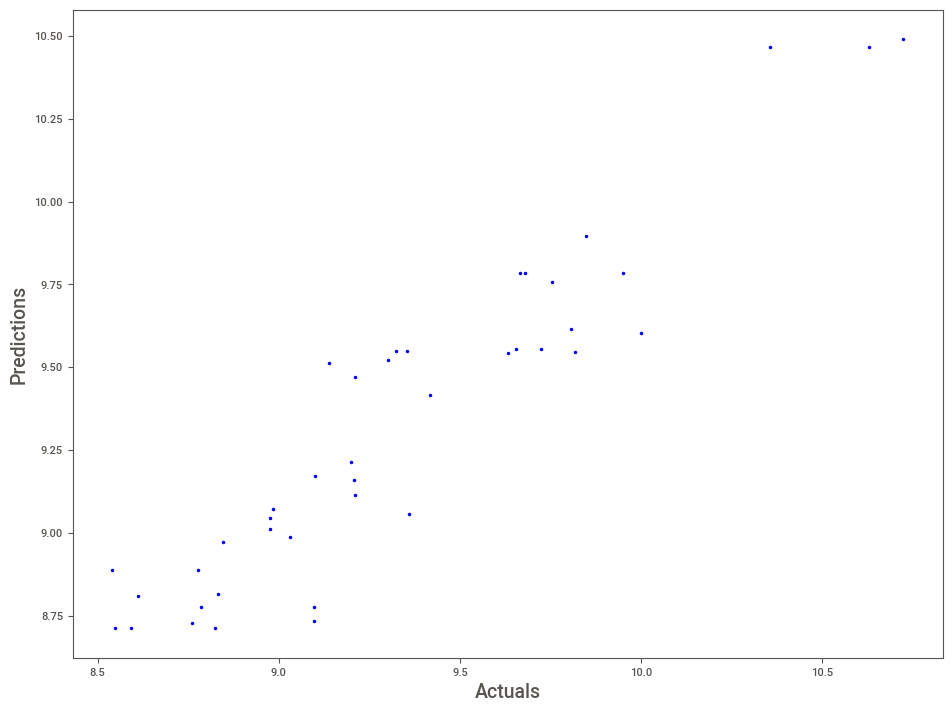

Maximum error:  4.110341365410805 %




In [51]:
names = ['XGBoost', 'AdaBoost']
regressors = [
              XGBRegressor(objective ='reg:squarederror'),
              AdaBoostRegressor()               ] 

for name, regr in zip(names, regressors):
  print('REGRESSOR: ',name,'\n')
  regr.fit(X_train_std, np.ravel(y_train_std))
  # Make predictions 
  y_pred_std = regr.predict(X_test_std)
  y_pred_std = pd.DataFrame(y_pred_std)
  y_pred = stdsc2.inverse_transform(y_pred_std)
  # Performance
  plt.figure(figsize=(10,8))
  Performance(y_test,y_pred)
  PredsVsActuals(y_test,y_pred)
  # Worst-case instance prediction
  y_pred = pd.DataFrame(y_pred) 
  y_test = pd.DataFrame(y_test)
  results = pd.concat([y_pred, y_test.set_index(y_pred.index)], axis=1)
  results.columns=['Pred','Act']
  results['error'] = (results.Pred - results.Act)/results.Act
  print('Maximum error: ',100*np.max(results.error),'%\n\n')

I choose the XGBoost.It's the best base model. 

### Grid Search

In [52]:
# Gridsearch the XGBoostRegressor hyperparameter space
model = XGBRegressor(objective ='reg:squarederror')
# define the grid of values to search
grid = dict()
grid['learning_rate']= [.05, 0.07]
grid['max_depth']= [7, 9]
grid['n_estimators'] = [400]
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=192837465)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='neg_mean_squared_error')
grid_result = grid_search.fit(X, y)
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (absolute(mean), stdev, param))

Best: -0.021040 using {'learning_rate': 0.07, 'max_depth': 7, 'n_estimators': 400}
0.021734 (0.003841) with: {'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 400}
0.021884 (0.003920) with: {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 400}
0.021040 (0.002919) with: {'learning_rate': 0.07, 'max_depth': 7, 'n_estimators': 400}
0.021787 (0.003748) with: {'learning_rate': 0.07, 'max_depth': 9, 'n_estimators': 400}


MSE: 0.03 
MAE: 0.15 
R^2: 0.88


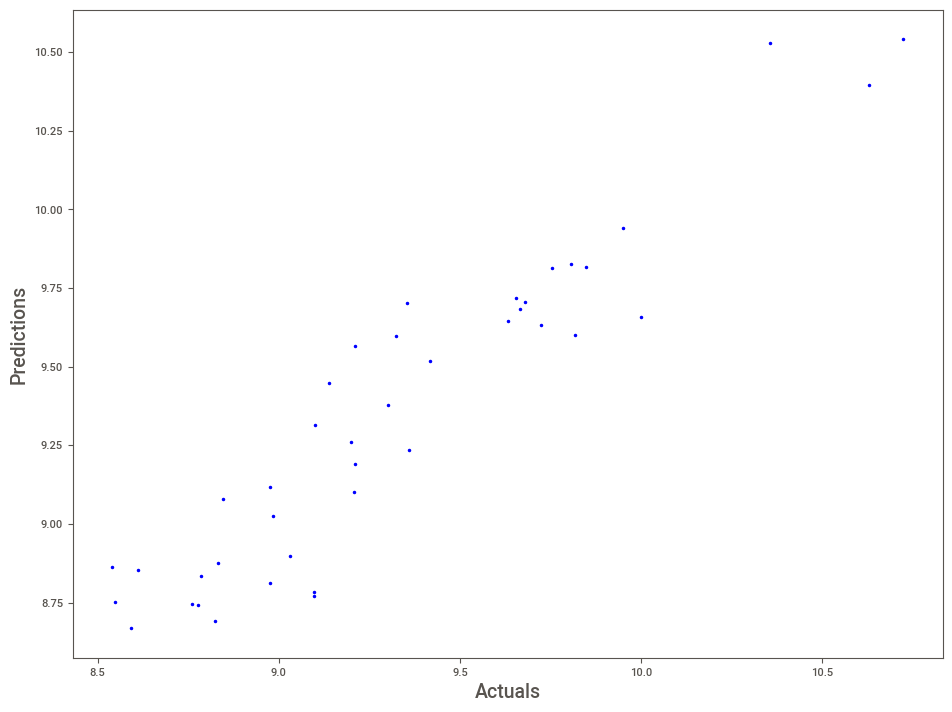

In [53]:
#Fit XGBRegressor and produce graph and performance results for holdout sample
regr = XGBRegressor(objective ='reg:squarederror',learning_rate=0.05,max_depth=7,n_estimators=400)
regr.fit(X_train_std, np.ravel(y_train_std))
# Make predictions 
y_pred_std = regr.predict(X_test_std)
y_pred_std = pd.DataFrame(y_pred_std)
y_pred = stdsc2.inverse_transform(y_pred_std)
# Performance
plt.figure(figsize=(10,8))
Performance(y_test,y_pred)
PredsVsActuals(y_test,y_pred)


## Learning Curves (With Cross Validation)

In [54]:
# Libraries
from sklearn.svm import SVR
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from sklearn.model_selection import ShuffleSplit
from xgboost import XGBRegressor
!pip install lightgbm
from lightgbm import LGBMRegressor
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline

from sklearn.utils._testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning

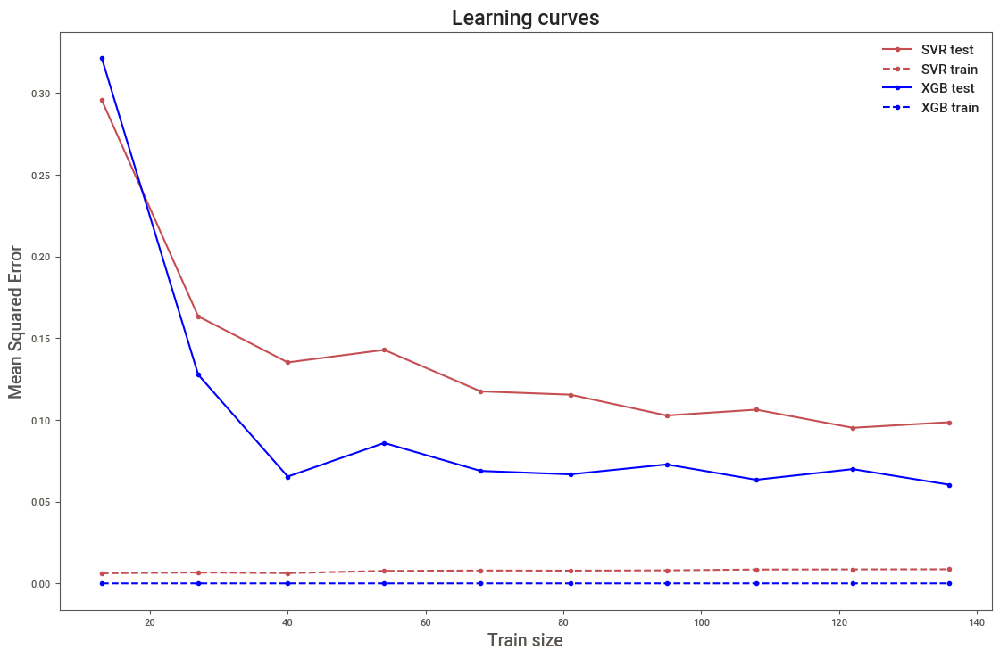

In [55]:
# Specify training set size for all cross validation folds
train_size = 0.2 * len(X)

# Learning Curves for XVR and XGBoost
svr = imbpipeline(steps = [['scaler', StandardScaler()],    
                                ['regressor', SVR()]])

XGB = imbpipeline(steps = [['scaler', StandardScaler()],    
                                ['regressor', XGBRegressor(objective ='reg:squarederror')]])

train_sizes, train_scores_svr, test_scores_svr = learning_curve(
    svr,
    X,
    np.ravel(y),
    train_sizes=np.linspace(0.1, 1, 10),
    scoring="neg_mean_squared_error",
    cv=3,
)

train_sizes_abs, train_scores_XGB, test_scores_XGB = learning_curve(
    XGB,
    X,
    np.ravel(y),
    train_sizes=np.linspace(0.1, 1, 10),
    scoring="neg_mean_squared_error",
    cv=3,
)

# Figure size
plt.rcParams["figure.figsize"] = (12, 8)
plt.figure()

plt.plot(train_sizes, -test_scores_svr.mean(1), "o-", color="r", label="SVR test")
plt.plot(train_sizes, -train_scores_svr.mean(1), "o--", color="r", label="SVR train")
plt.plot(train_sizes, -test_scores_XGB.mean(1), "o-", color="blue", label="XGB test")
plt.plot(train_sizes, -train_scores_XGB.mean(1), "o--", color="blue", label="XGB train")
plt.xlabel("Train size")
plt.ylabel("Mean Squared Error")
plt.title("Learning curves")
plt.legend(loc="best")
plt.show()

### Over Prediction

In [56]:
# Percentage overprediction
y_pred = pd.DataFrame(y_pred) 
y_test = pd.DataFrame(y_test)
results = pd.concat([y_pred, y_test.set_index(y_pred.index)], axis=1)
results.columns=['Pred','Act']
results['%error'] = 100* (results.Pred - results.Act)/results.Act
results = pd.DataFrame(results)
ovr_pred = 0
for index, instance in results.iterrows():
    if results.at[index,'%error'] > 0:
        ovr_pred = ovr_pred + 1
print('Percentage of instance overpredicted: ',100*ovr_pred/len(results))

Percentage of instance overpredicted:  58.53658536585366


#**Conclusion**
Here we answer the business problems in a more detailed way.

## Understanding the dataset
PCA and feature importance gave us an insight into this dataset. We do know that ['highwaympg','enginesize', 'curbweight'] are much more important than the others, but PCA indicates that the dataset's variables are not linearly correlated which is a relationship to be closely examined because the first several principle components does not explain considerable amount of variance.

## Building models
Our work above involves comparing a set base models and selecting two of the best. We carefully examined the best models and determined that XGBoost might be preferred, on the basis of which we did a grid search and began exmining its performance. Overall, XGBoost is doing as expected.

Compared with low-code PyCaret: Pycaret determines that the Random Forest Regressor and Extra Trees Regressor are the best models. In the sense of MSE, the model that Low-code PyCaret chose is Extra Trees Regressor.